### Importing the necesssary libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import OrdinalEncoder, power_transform
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from category_encoders import BinaryEncoder
from sklearn.metrics import mean_squared_error

### Importing the dataset. As per the problem statement we will be predicting Next_Tmax and Next_Tmin

In [2]:
dataset =  pd.read_csv(r'C:\Users\LENOVO\Documents\Post Graduation\data sets\Dataset2-main\temperature.csv')
dataset.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


### Identifying the type of numerical data available in the dataset

In [3]:
dataset.iloc[:,:13].head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892


In [4]:
dataset.iloc[:,13:].head()

,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


### I can see that most of the data is of continuous data type, Date will be the catgorical variable. We can extract ordinal features out of the same

### Checking the shape of the dataset

In [5]:
dataset.shape

(7752, 25)

### The dataset consists of 7752 rows and 25 columns

### Checking for null data and data type

In [6]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


### There are null values in most ofthe columns and I can see all the data types are in float (continuous)

### Extracting the features from the Date columns and removing the Date after feature extraction

In [7]:
dataset['Date'] = pd.to_datetime(dataset['Date'], errors = 'coerce')
dataset['month'] = dataset['Date'].dt.month

In [8]:
dataset['year'] = dataset['Date'].dt.year
dataset['day'] = dataset['Date'].dt.day

In [9]:
dataset = dataset.drop(columns = 'Date')

### Checking for the data distribution using describe method to see whether there is any discrepencies in the meand an standard deviation

In [10]:
dataset.iloc[:,:15].describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,0.356080,0.318404,0.299191,0.591995,0.485003
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,0.258061,0.250362,0.254348,1.945768,1.762807
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,0.140615,0.101388,0.081532,0.000000,0.000000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,0.312421,0.262555,0.227664,0.000000,0.000000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,0.558694,0.496703,0.499489,0.052525,0.018364
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661


In [11]:
dataset.iloc[:,15:].describe()

,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,month,year,day
count,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000,7750.000000,7750.000000,7750.000000
mean,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220,7.080645,2015.000000,16.370968
std,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613,2.238364,1.414305,8.241331
min,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000,1.000000,2013.000000,7.000000
25%,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000,7.000000,2014.000000,8.000000
50%,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000,7.000000,2015.000000,16.000000
75%,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000,8.000000,2016.000000,24.000000
max,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000,12.000000,2017.000000,31.000000


## Analysis for the target variable Next_Tmax

## Next_Tmax V/s Station

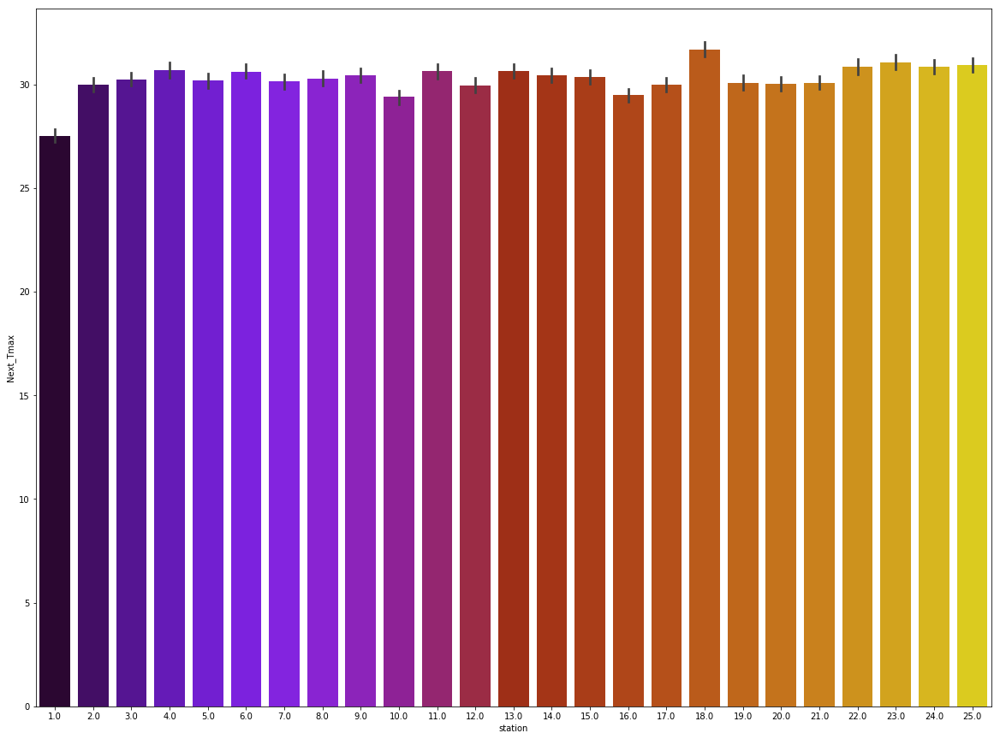

In [12]:
plt.figure(figsize = (20,15))
sns.barplot(x = 'station', y = 'Next_Tmax', data = dataset, palette = 'gnuplot')

### I can see that there is a little correlation with the station and Next_Tmax. and the station 18 generated highest Tmax

## Present_Tmax V/s Next_Tmax

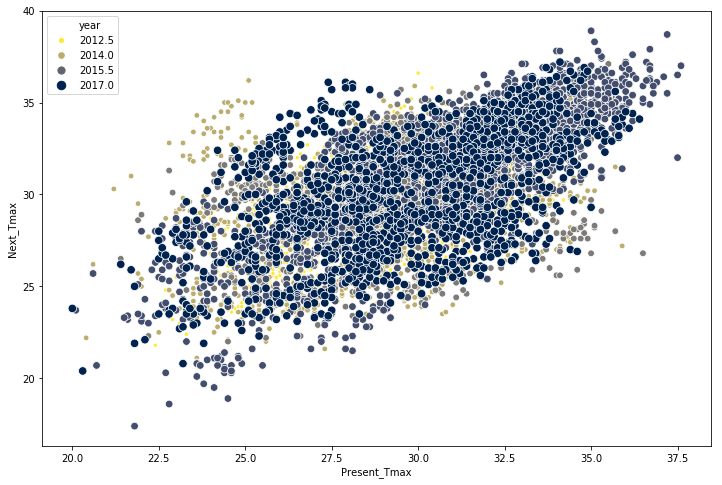

In [13]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'Present_Tmax', y = 'Next_Tmax', hue = 'year',size = 'year',data =dataset,palette = 'cividis_r' )

### Upon reveiewing, I can say that overall there is a positive relationship with the Present and Next Tmax temperature slightly differs from the present max. Example for the year 2013, the present temperature is  around 25 and the previous temperature is around 35 mark

## Present_Tmin V/s Next_Tmax

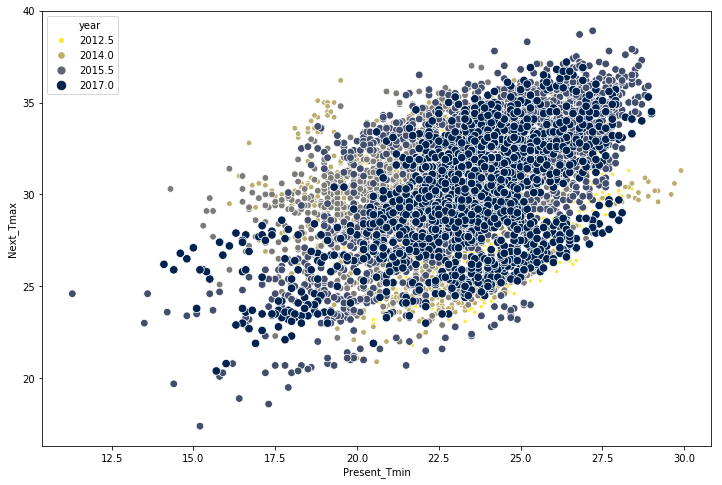

In [14]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'Present_Tmin', y = 'Next_Tmax', hue = 'year',size = 'year',data =dataset,palette = 'cividis_r' )

### The present Tmin also has a similar positve relationship with the Next_Tmax.

## LDAPS_RHmin V/s Next_Tmax

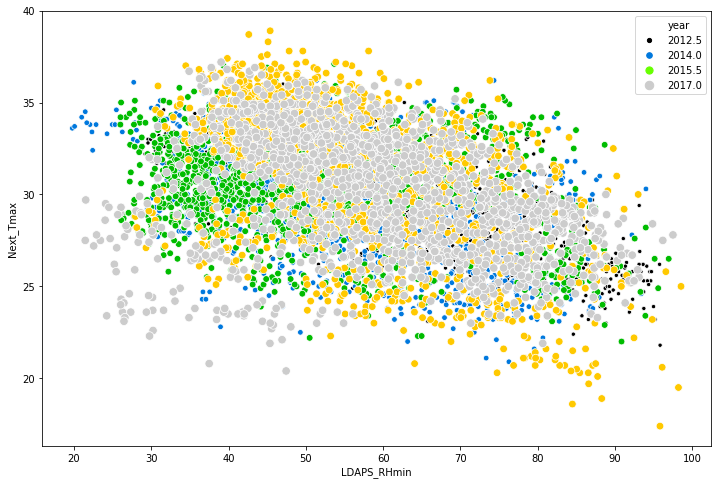

In [15]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_RHmin', y = 'Next_Tmax', hue = 'year',size = 'year',data =dataset,palette = 'nipy_spectral' )

### From the above analysis we can say that the LDAPS_RHmin has slight negative relation with the Next_Tmin

## LDAPS_RHmax V/s Next_Tmax

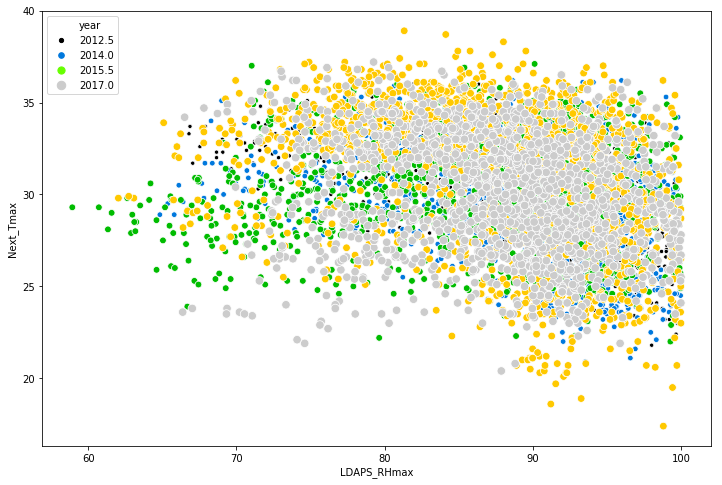

In [16]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_RHmax', y = 'Next_Tmax', hue = 'year',size = 'year',data =dataset,palette = 'nipy_spectral' )

### There is no visual relation ship between the LDAPS_RHmax and Next_Tmax

## LDAPS_Tmax_lapse V/s Next_Tmax

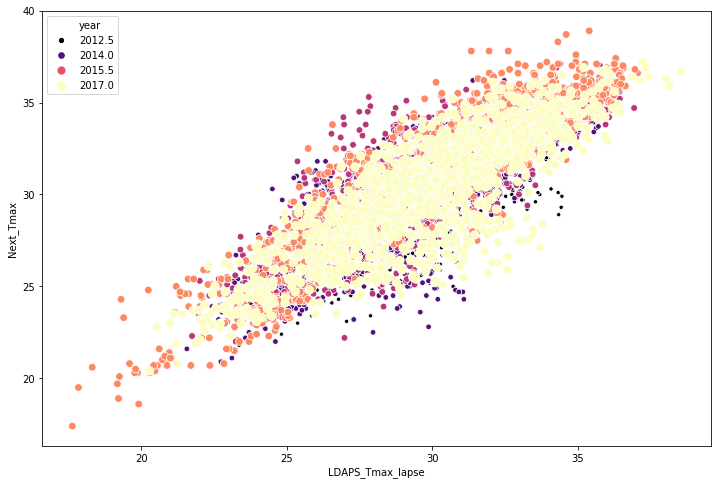

In [17]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_Tmax_lapse', y = 'Next_Tmax', hue = 'year',size = 'year',data =dataset,palette = 'magma' )

### There is a good positive relation ship with LDAPS_Tmax_lapse and Next_Tmax

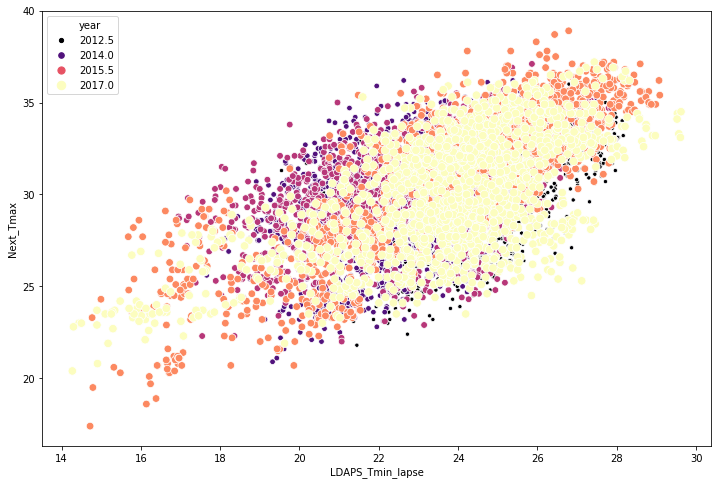

In [18]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_Tmin_lapse', y = 'Next_Tmax', hue = 'year',size = 'year',data =dataset,palette = 'magma' )

### The column LDAPS_Tmin_lapse has a good positive relationsip  with Next_Tmax

## LDAPS_WS V/S Next_Tmax

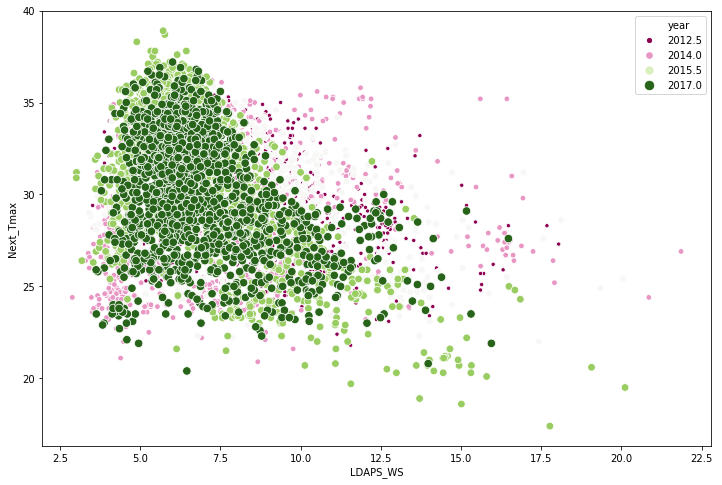

In [19]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_WS', y = 'Next_Tmax', hue = 'year',size = 'year',data =dataset,palette = 'PiYG' )

### We can see from the above plot that LDAPS_WS has a slight negative relation ship with the target variable

## LDAPS_LH V/S Next_Tmax

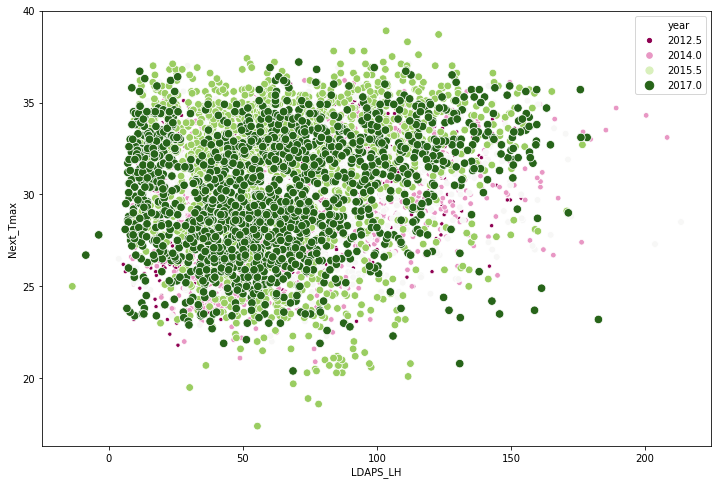

In [20]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_LH', y = 'Next_Tmax', hue = 'year',size = 'year',data =dataset,palette = 'PiYG' )

### There is no visible relationship with the LDAPS_LH and Next_Tmax

## LDAPS_CC1 V/S Next_Tmax

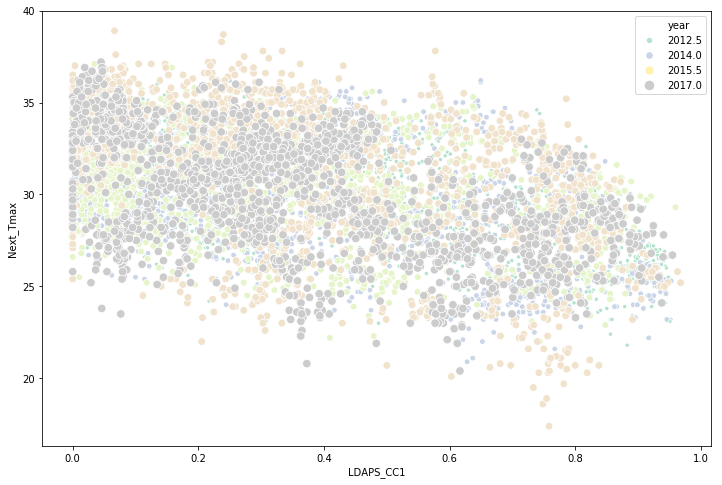

In [21]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_CC1', y = 'Next_Tmax', hue = 'year',size = 'year',data =dataset,palette = 'Pastel2' )

### There is a slight negative relationship between LDAPS_CC1 and Next_Tmax

## LDAPS_CC2 V/S Next_Tmax

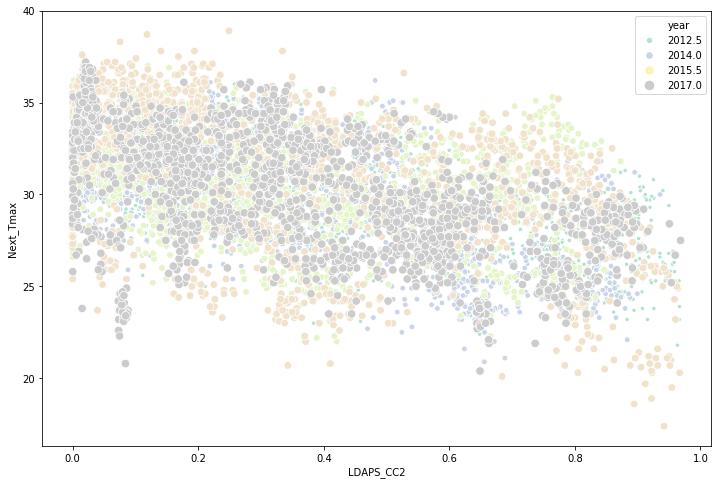

In [22]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_CC2', y = 'Next_Tmax', hue = 'year',size = 'year',data =dataset,palette = 'Pastel2' )

### There is a slight negative relationship between LDAPS_CC2 and Next_Tmax

## LDAPS_CC3 V/S Next_Tmax

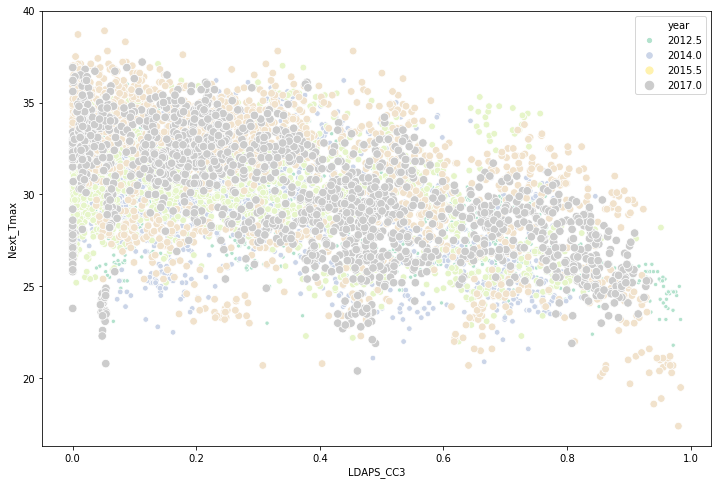

In [23]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_CC3', y = 'Next_Tmax', hue = 'year',size = 'year',data =dataset,palette = 'Pastel2' )

### There is a slight negative relationship between LDAPS_CC3 and Next_Tmax

## LDAPS_CC4 V/S Next_Tmax

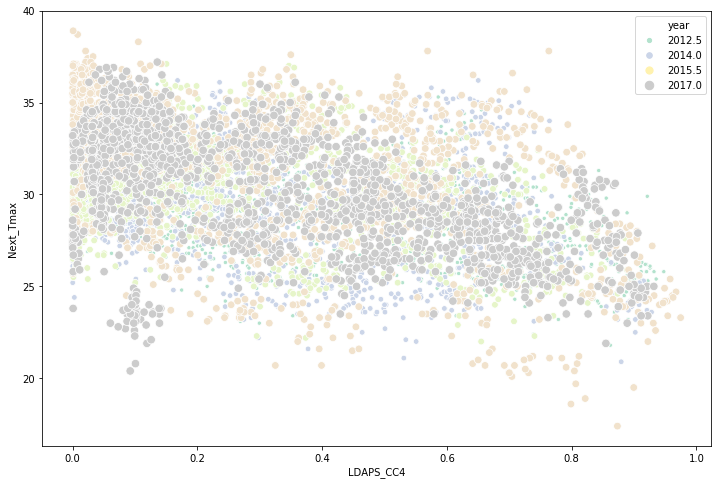

In [24]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_CC4', y = 'Next_Tmax', hue = 'year',size = 'year',data =dataset,palette = 'Pastel2' )

### There is a slight negative relationship between LDAPS_CC4 and Next_Tmax

## LDAPS_PPT1 V/S Next_Tmax

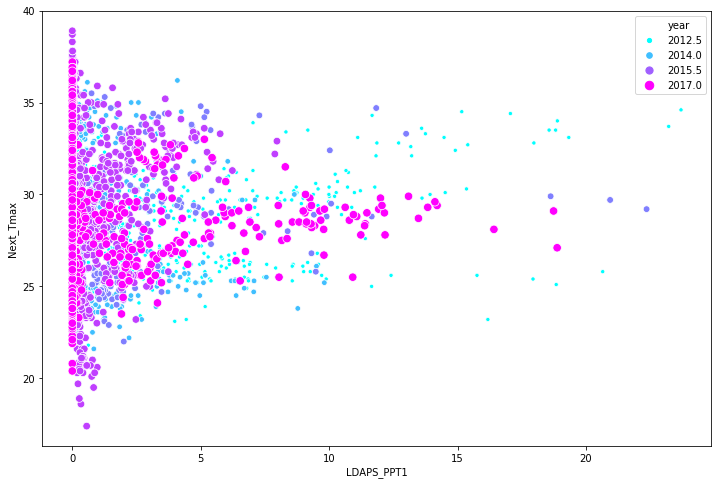

In [25]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_PPT1', y = 'Next_Tmax', hue = 'year',size = 'year',data =dataset,palette = 'cool' )

## LDAPS_PPT2 V/S Next_Tmax

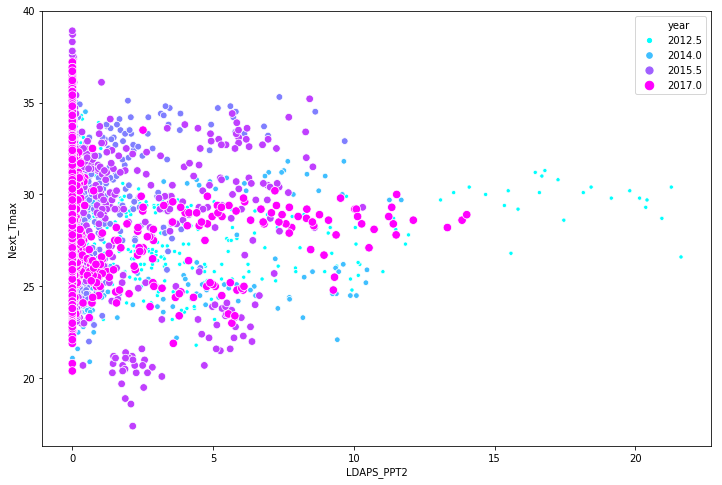

In [26]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_PPT2', y = 'Next_Tmax', hue = 'year',size = 'year',data =dataset,palette = 'cool' )

## LDAPS_PPT3 V/S Next_Tmax

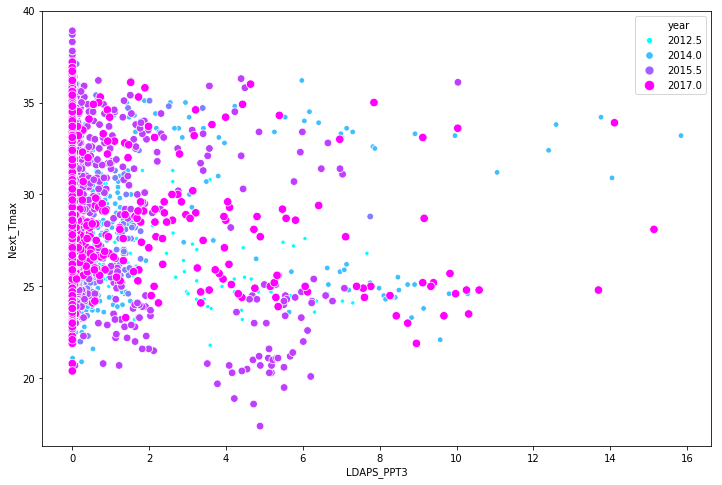

In [27]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_PPT3', y = 'Next_Tmax', hue = 'year',size = 'year',data =dataset,palette = 'cool' )

## LDAPS_PPT4 V/S Next_Tmax

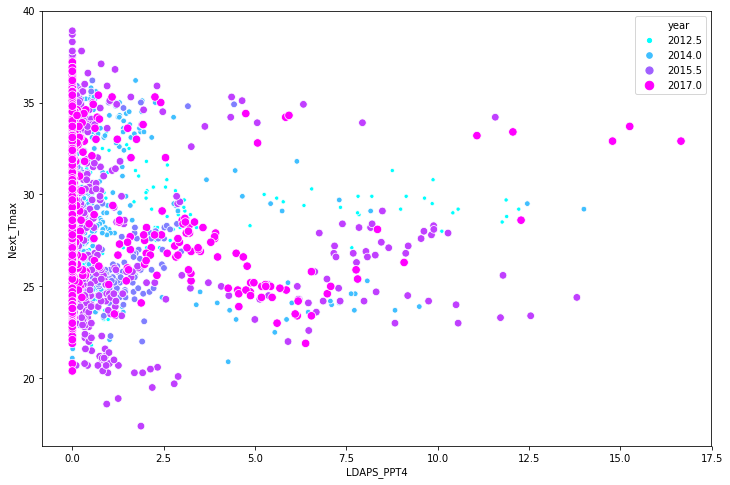

In [28]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_PPT4', y = 'Next_Tmax', hue = 'year',size = 'year',data =dataset,palette = 'cool' )

### There is no visible relation ship with the LDAPS_PPTs with the Next_Tmax

## Latitude V/S longitude data

In [29]:
img = plt.imread(r'C:\Users\LENOVO\Documents\Post Graduation\maps.png')

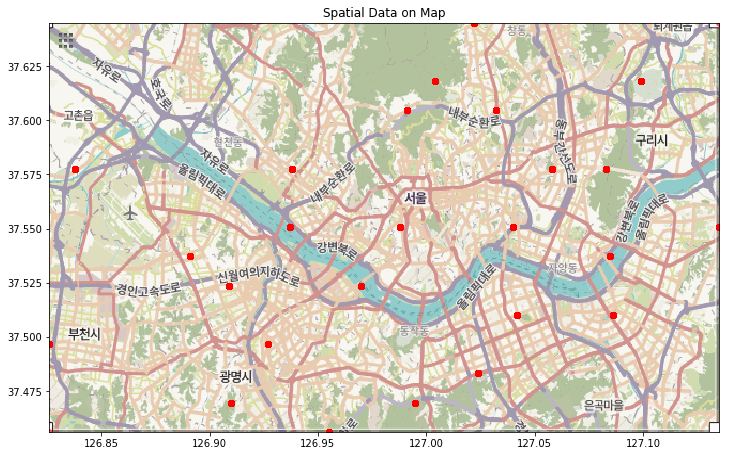

In [30]:
Box = ((dataset['lon'].min(),   dataset['lon'].max(), dataset['lat'].min(), dataset['lat'].max()))

fig, ax = plt.subplots(figsize = (12,8))
ax.scatter(dataset['lon'], dataset['lat'], zorder=1, alpha= 0.6, c='r', s=dataset['Next_Tmax'].mean())
ax.set_title('Spatial Data on Map')
ax.set_xlim(Box[0],Box[1])
ax.set_ylim(Box[2],Box[3])
ax.imshow(img, zorder=0, extent = Box, aspect= 'equal')

## DEM v/s Next_Tmax

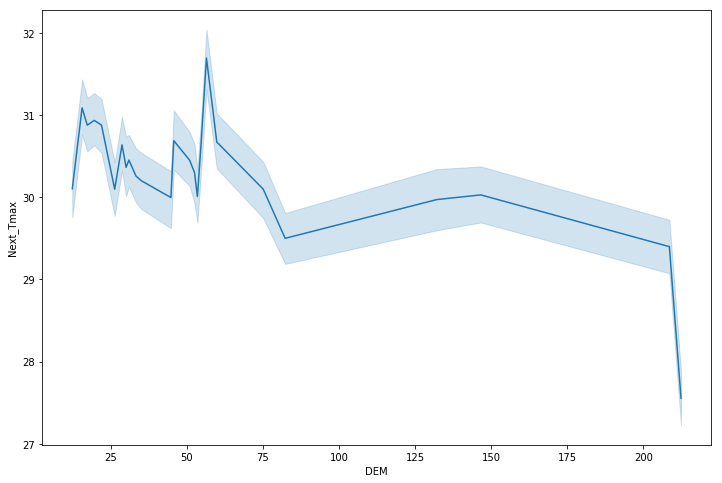

In [31]:
plt.figure(figsize = (12,8))
sns.lineplot(x = 'DEM', y = 'Next_Tmax',data =dataset,palette = 'vlag' )

### The Net_Tmax decreases with increase in DEM (Elevation)

## Net Tmax V/S Slope

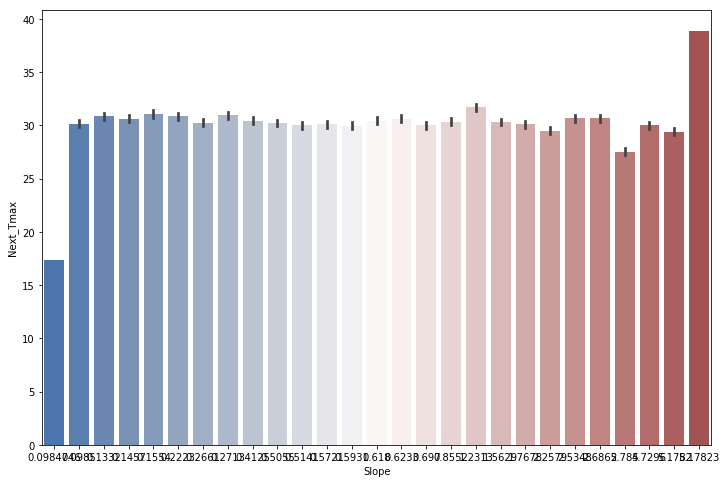

In [32]:
plt.figure(figsize = (12,8))
sns.barplot(x = 'Slope', y = 'Next_Tmax',data =dataset,palette = 'vlag' )

### The slope doesn't have any relationship with the net_Tmax and the slope. only if the slope is greater than 5 then the  Net.Tmax is higher

## Solar radiation v/s Net_Tmax

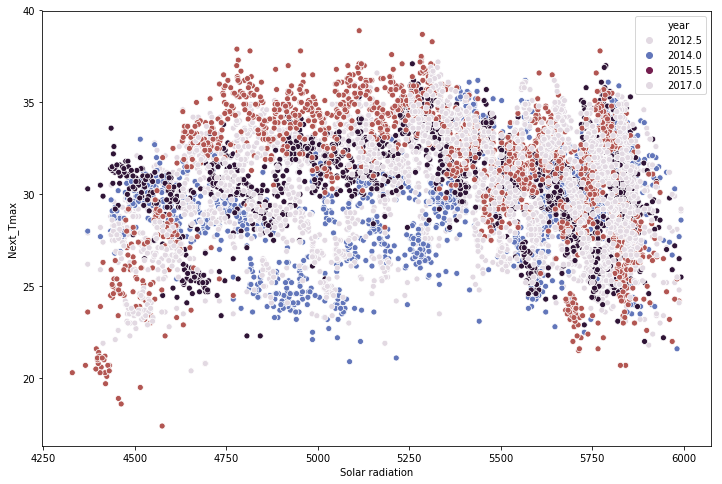

In [33]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'Solar radiation', y = 'Next_Tmax', hue = 'year',data =dataset,palette = 'twilight' )

### The solar radiation doesn't have much visual relationship with the Net_Tmax

## Net_Tmax V/s Net_Tmin

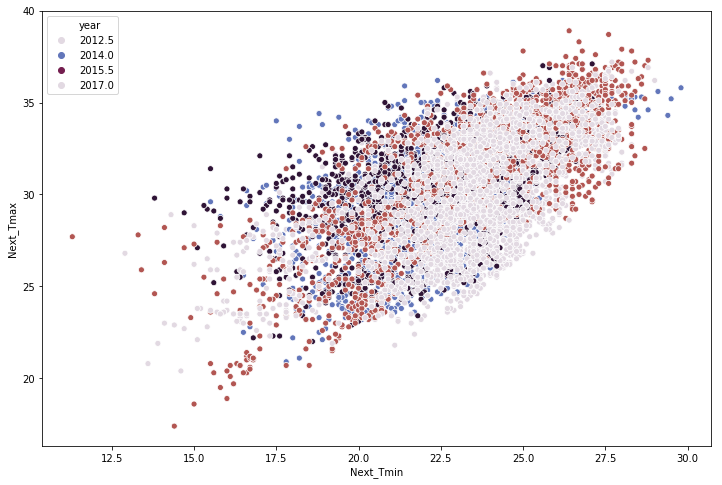

In [34]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'Next_Tmin', y = 'Next_Tmax', hue = 'year',data =dataset,palette = 'twilight' )

### Over the years, Net_Tmin and NetTmax has a positive relationship

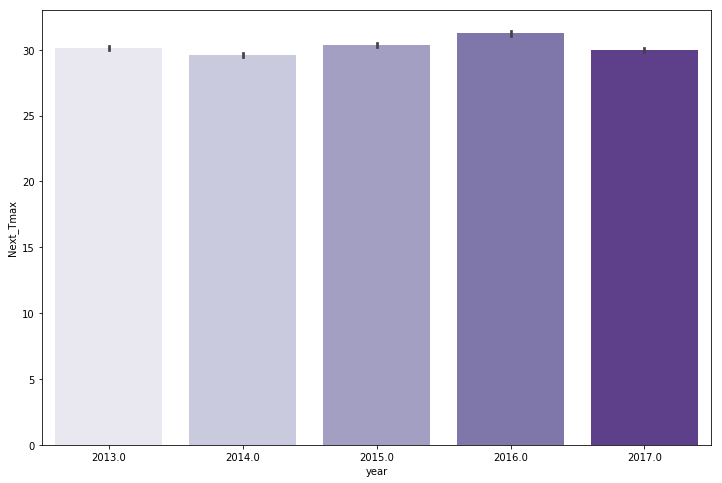

In [35]:
plt.figure(figsize = (12,8))
sns.barplot(x = 'year', y = 'Next_Tmax',data =dataset,palette = 'Purples' )

### The Net_Tmax ig highest during the year 2016 and lowest during 2014.

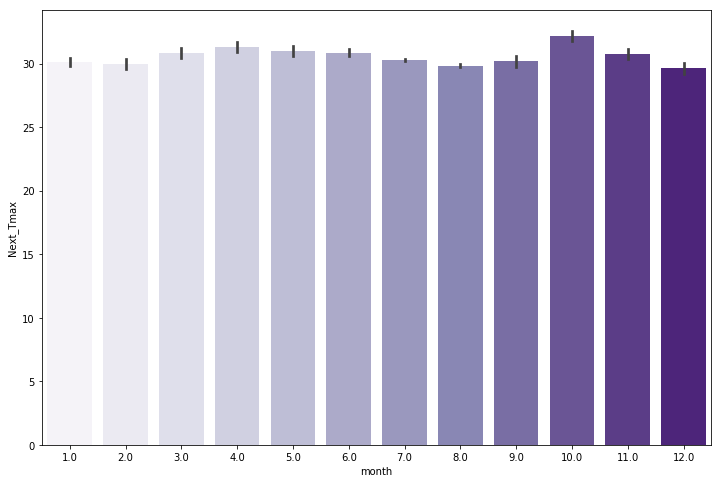

In [36]:
plt.figure(figsize = (12,8))
sns.barplot(x = 'month', y = 'Next_Tmax',data =dataset,palette = 'Purples' )

### The net T max is highest during the month of october and lowest in Jan

# Getting the relationship between Net_Tmin and the variables

### Next_Tmin V/s Station

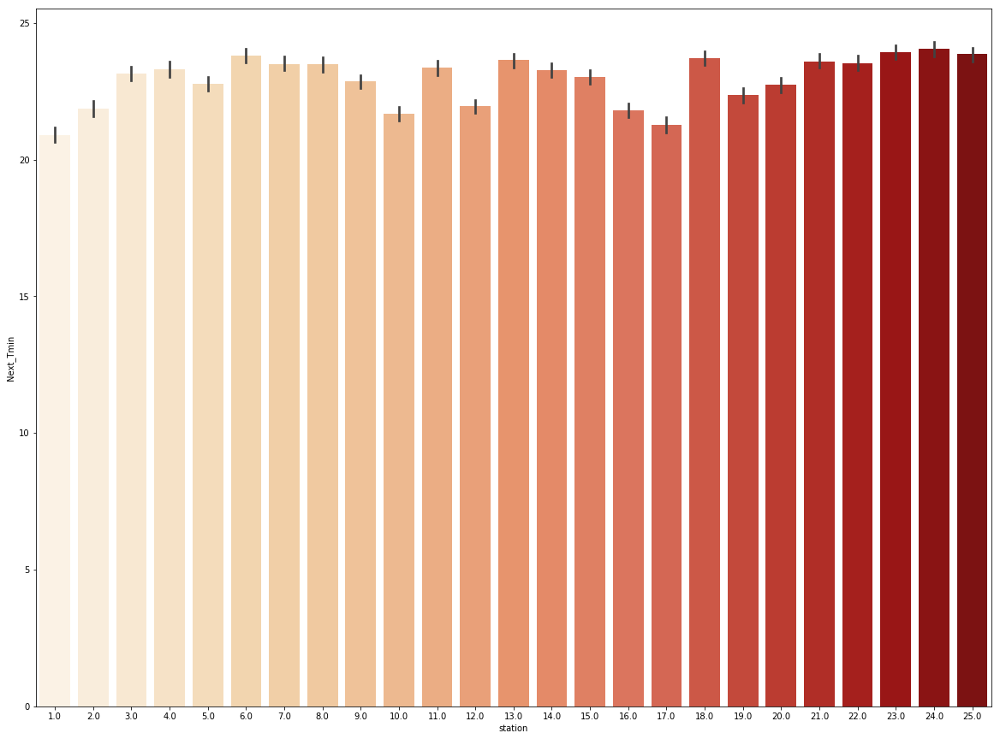

In [37]:
plt.figure(figsize = (20,15))
sns.barplot(x = 'station', y = 'Next_Tmin', data = dataset, palette = 'OrRd')

### The temperature (Tmin) was minimal at the station 1 and it was highest in the station 18

### Present_Tmax V/s Next_Tmin

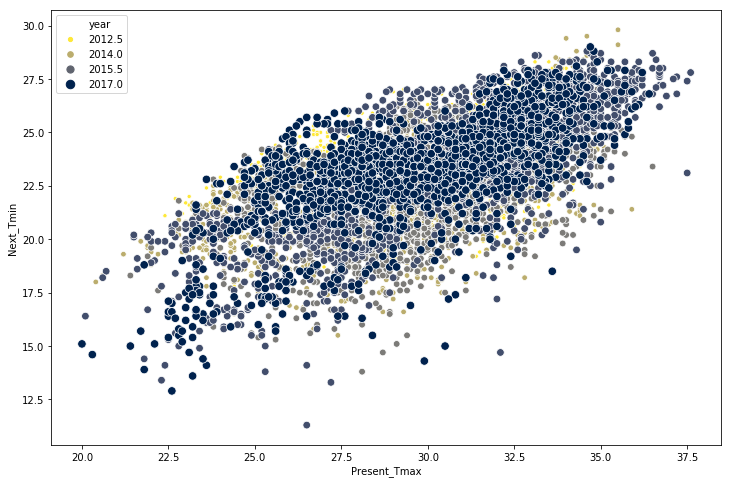

In [38]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'Present_Tmax', y = 'Next_Tmin', hue = 'year',size = 'year',data =dataset,palette = 'cividis_r' )

### We can see from the plot that the attribute present Tmax has linear relation with next Tmin

### Present_Tmin V/s Next_Tmin

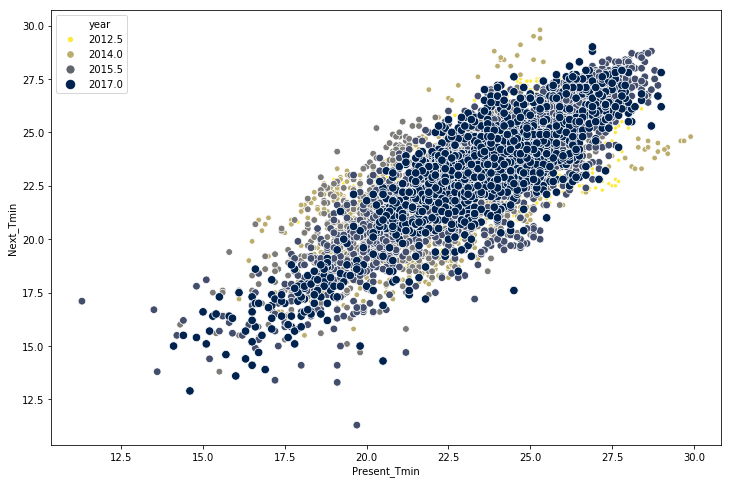

In [39]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'Present_Tmin', y = 'Next_Tmin', hue = 'year',size = 'year',data =dataset,palette = 'cividis_r' )

### We can see from the plot that the attribute present Tmin has linear relation with next Tmin

### LDAPS_RHmin V/s Next_Tmin

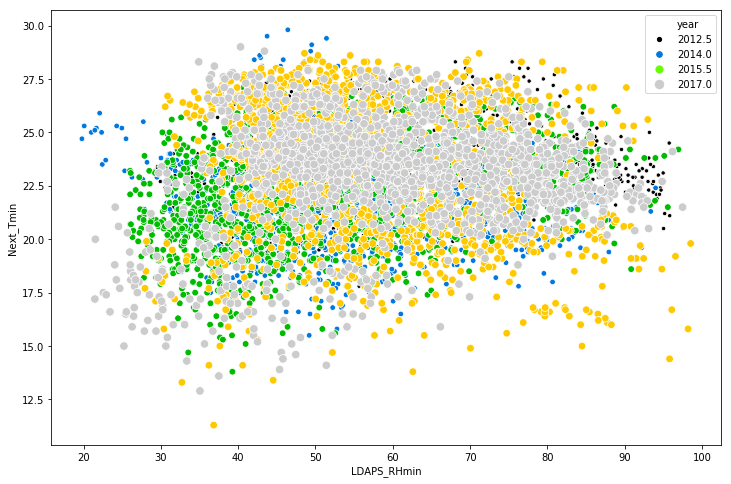

In [40]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_RHmin', y = 'Next_Tmin', hue = 'year',size = 'year',data =dataset,palette = 'nipy_spectral' )

### Upon review, I can see that there is no visible relationship between LDAPS_RHmin and Next_Tmin

### LDAPS_RHmax V/s Next_Tmin

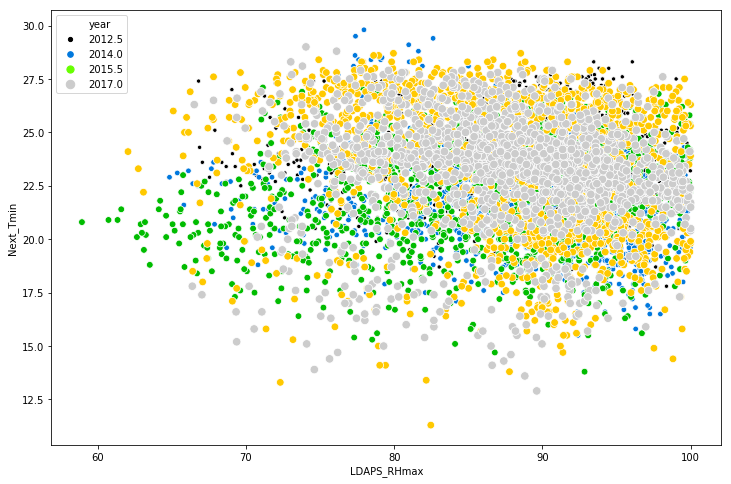

In [41]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_RHmax', y = 'Next_Tmin', hue = 'year',size = 'year',data =dataset,palette = 'nipy_spectral' )

### No visible relationship

### Next_Tmin V/s LDAPS_Tmax_lapse

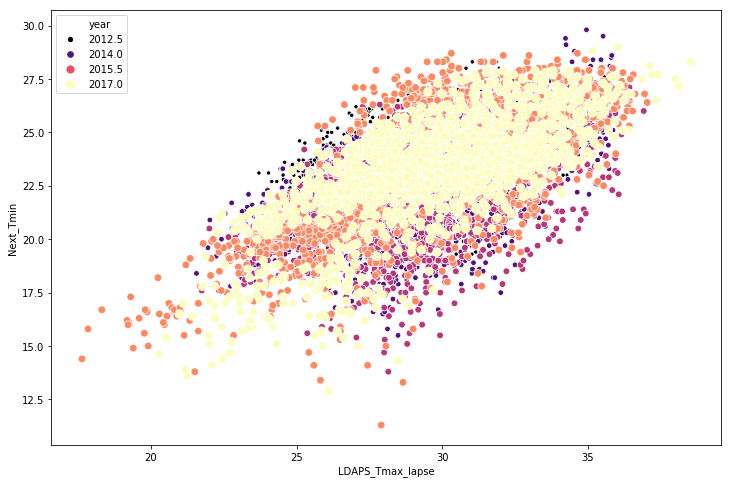

In [42]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_Tmax_lapse', y = 'Next_Tmin', hue = 'year',size = 'year',data =dataset,palette = 'magma' )

### there is a positive relation ship for the attribute LDAPS_Tmax_lapse with Next_Tmin

### LDAPS_Tmin_lapse V/s Next_Tmin

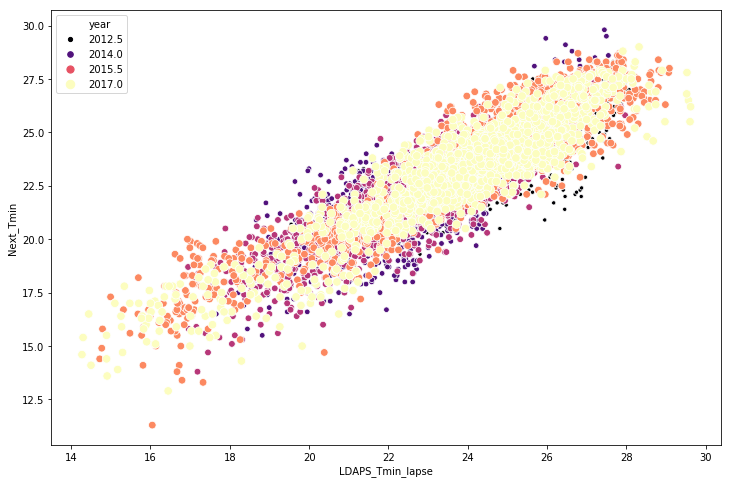

In [43]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_Tmin_lapse', y = 'Next_Tmin', hue = 'year',size = 'year',data =dataset,palette = 'magma' )

### There is a good positive relation ship with LDAPS_Tmin_lapse and Next_Tmin

### LDAPS_WS V/S Next_Tmin

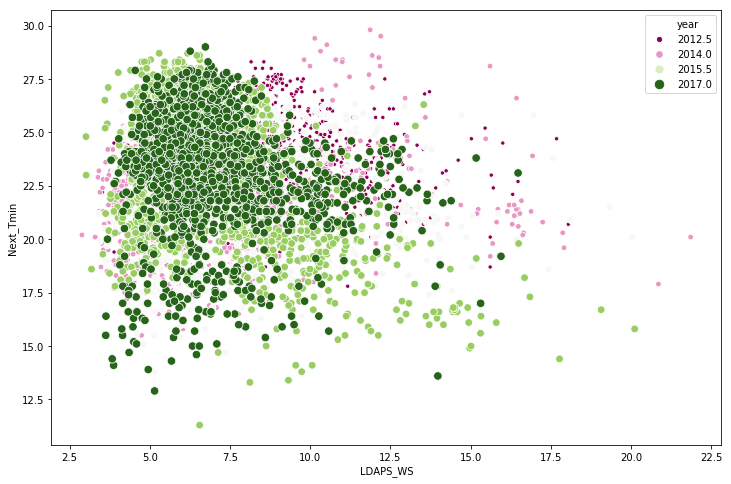

In [44]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_WS', y = 'Next_Tmin', hue = 'year',size = 'year',data =dataset,palette = 'PiYG' )

### There is a slight negative relationship between LDAPS_WS and Next_Tmin

### LDAPS_LH V/S Next_Tmin

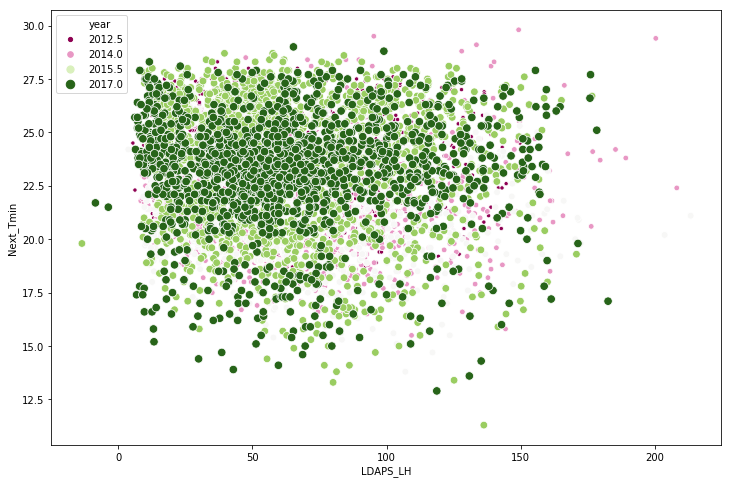

In [45]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_LH', y = 'Next_Tmin', hue = 'year',size = 'year',data =dataset,palette = 'PiYG' )

### There is no visible relationship between LDAPS_LH and Next_Tmin

### LDAPS_CC1 V/S Next_Tmin

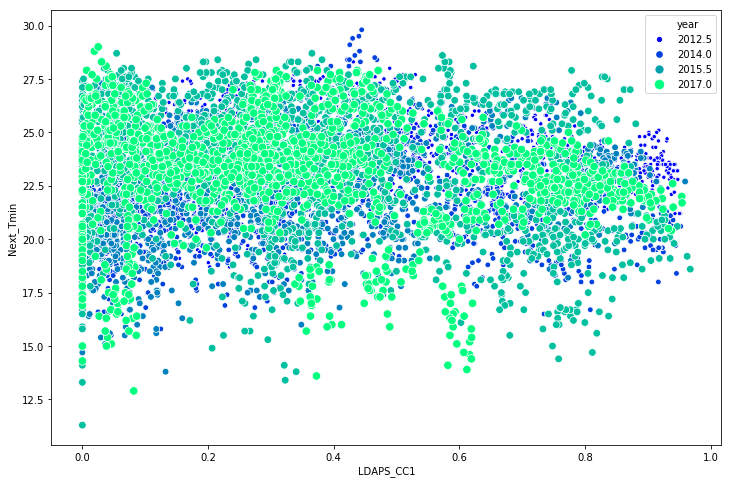

In [46]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_CC1', y = 'Next_Tmin', hue = 'year',size = 'year',data =dataset,palette = 'winter' )

### LDAPS_CC2 V/S Next_Tmin

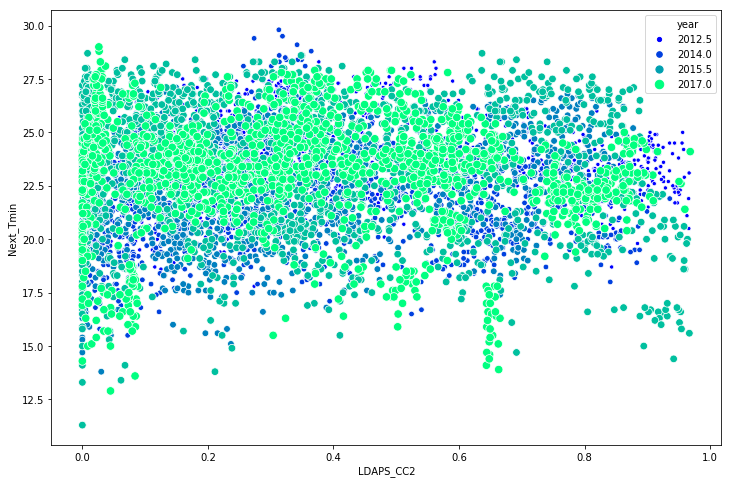

In [47]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_CC2', y = 'Next_Tmin', hue = 'year',size = 'year',data =dataset,palette = 'winter' )

### LDAPS_CC3 V/S Next_Tmin

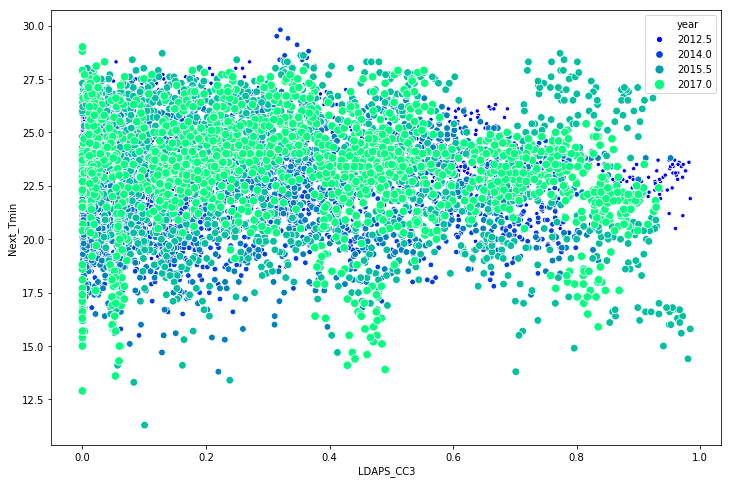

In [48]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_CC3', y = 'Next_Tmin', hue = 'year',size = 'year',data =dataset,palette = 'winter' )

### LDAPS_CC4 V/S Next_Tmin

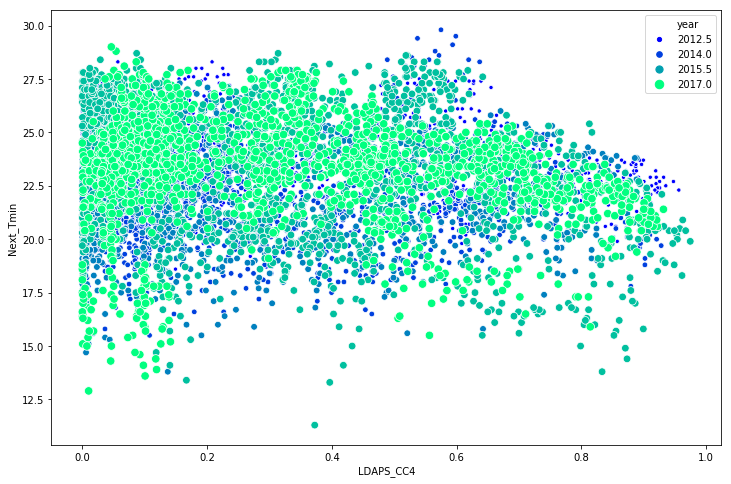

In [49]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_CC4', y = 'Next_Tmin', hue = 'year',size = 'year',data =dataset,palette = 'winter' )

### From the above diagrams, we can see that there is no visual relationships with the LDAPS_CC and Next_Tmin

### LDAPS_PPT1 V/S Next_Tmin

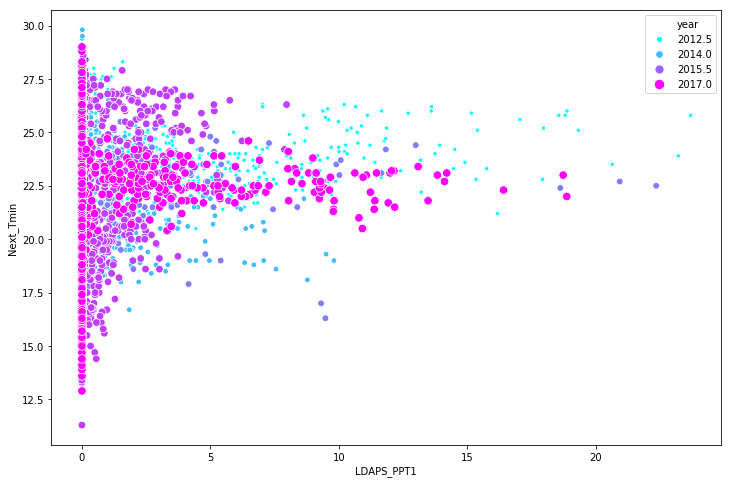

In [50]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_PPT1', y = 'Next_Tmin', hue = 'year',size = 'year',data =dataset,palette = 'cool' )

### LDAPS_PPT2 V/S Next_Tmin

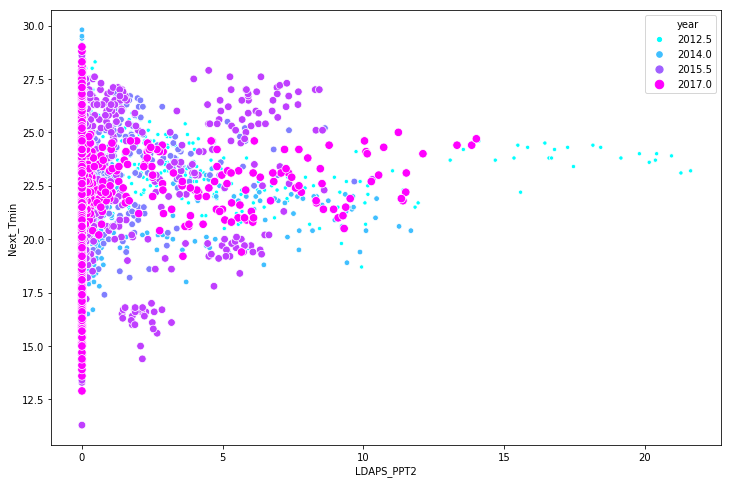

In [51]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_PPT2', y = 'Next_Tmin', hue = 'year',size = 'year',data =dataset,palette = 'cool' )

### LDAPS_PPT3 V/S Next_Tmin

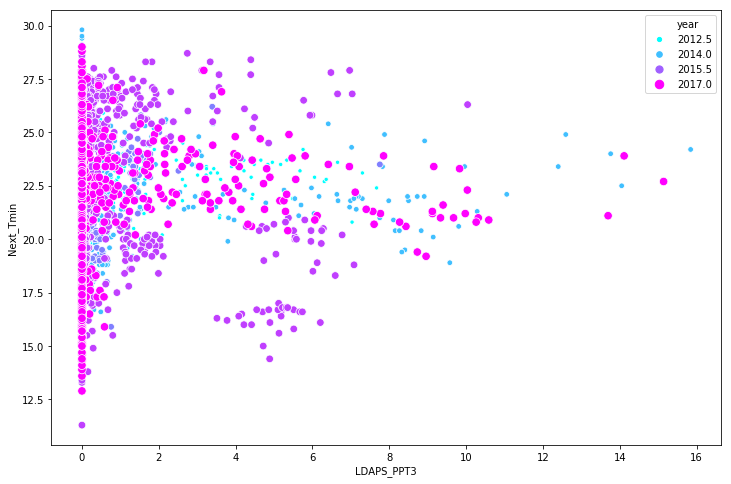

In [52]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_PPT3', y = 'Next_Tmin', hue = 'year',size = 'year',data =dataset,palette = 'cool' )

### LDAPS_PPT4 V/S Next_Tmin

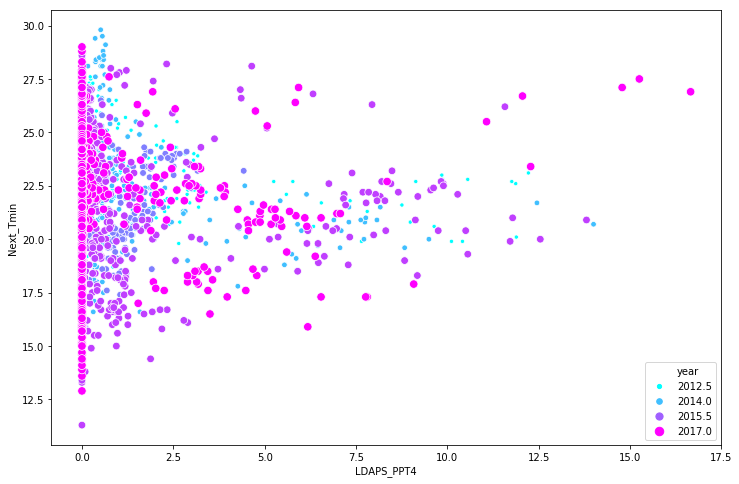

In [53]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'LDAPS_PPT4', y = 'Next_Tmin', hue = 'year',size = 'year',data =dataset,palette = 'cool' )

### Further there is no visual relationship for the variables LDAPS_PPT  with the Net_Tmin 

### DEM V/S Next_Tmin

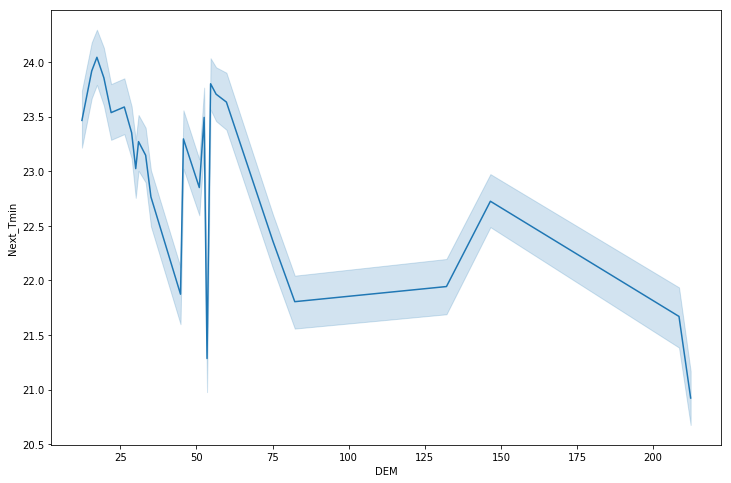

In [54]:
plt.figure(figsize = (12,8))
sns.lineplot(x = 'DEM', y = 'Next_Tmin',data =dataset,palette = 'vlag' )

### From the above figure, I can see that when the DEM is increased overall te Next_Tmin is also decreased

### Slope V/S Next_Tmin

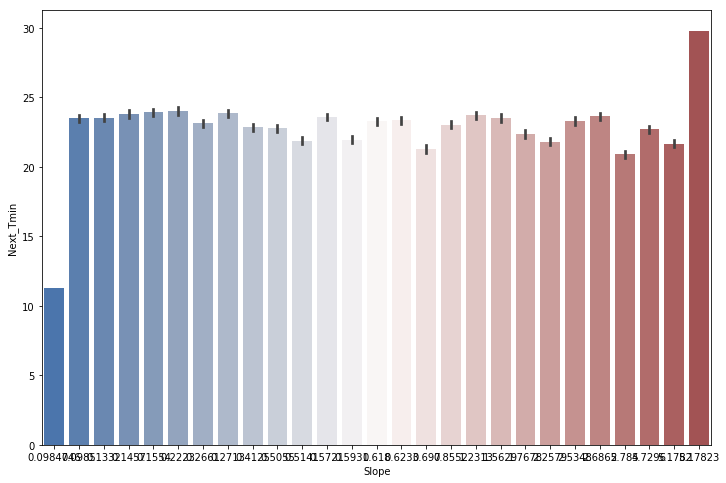

In [55]:
plt.figure(figsize = (12,8))
sns.barplot(x = 'Slope', y = 'Next_Tmin',data =dataset,palette = 'vlag' )

### There isn't any visible trend in Slope V/s Next_Tmin

### Solar radiation V/S Next_Tmin

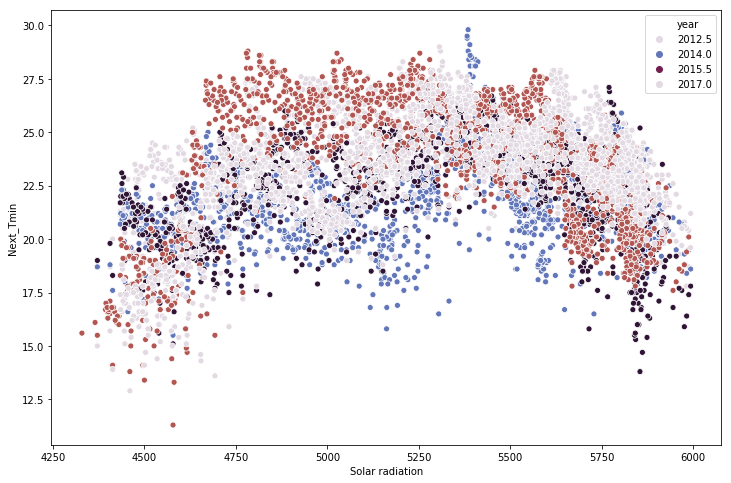

In [56]:
plt.figure(figsize = (12,8))
sns.scatterplot(x = 'Solar radiation', y = 'Next_Tmin', hue = 'year',data =dataset,palette = 'twilight' )

### Just like the Next_Tmax there is no linear Trend with respect to Solar radiation

### Year V/s Next_Tmin

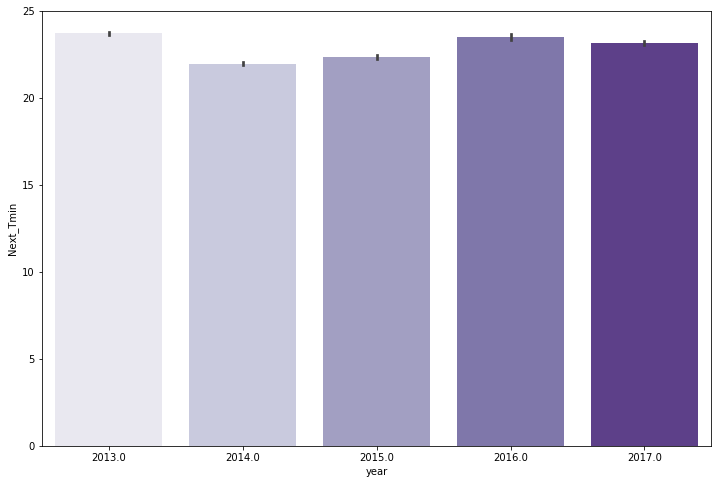

In [57]:
plt.figure(figsize = (12,8))
sns.barplot(x = 'year', y = 'Next_Tmin',data =dataset,palette = 'Purples')

### Upon reviewing, I can see that the year 2013 recorded high Next_Tmin temperature

### month V/S Next_Tmin

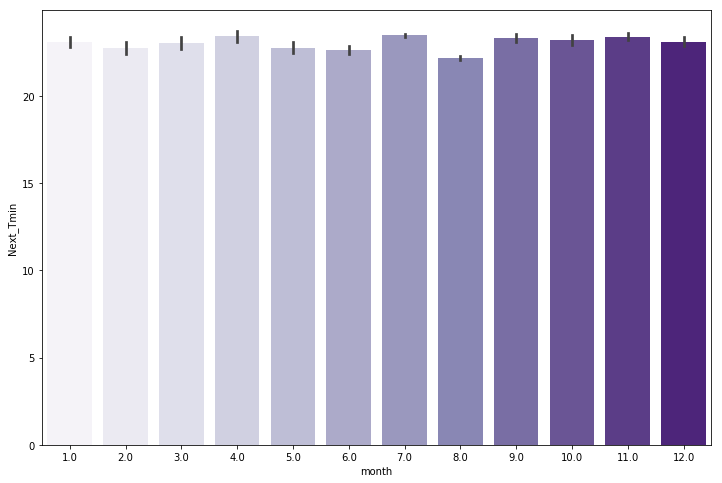

In [58]:
plt.figure(figsize = (12,8))
sns.barplot(x = 'month', y = 'Next_Tmin',data =dataset,palette = 'Purples' )

### I can see that during the month of July, the temperature of Next_Tmin was high and during August the Next_Tmin was low

### There is no imputation required in this dataset because all the columns are numeric type. Therefore, let's proceed with checking for correlation

### Checking for correlation of the Next_Tmax

In [59]:
max_cor = dataset.corr()
max_cor['Next_Tmax'].sort_values(ascending = False)

Next_Tmax           1.000000
LDAPS_Tmax_lapse    0.836144
Next_Tmin           0.621427
Present_Tmax        0.613109
LDAPS_Tmin_lapse    0.593195
Present_Tmin        0.473868
LDAPS_LH            0.159324
station             0.108306
year                0.060216
Solar radiation     0.008809
lon                 0.003060
month              -0.026910
lat                -0.053567
Slope              -0.102838
day                -0.117092
LDAPS_PPT1         -0.120079
DEM                -0.172674
LDAPS_PPT2         -0.180449
LDAPS_PPT4         -0.180669
LDAPS_PPT3         -0.196845
LDAPS_RHmax        -0.286478
LDAPS_WS           -0.346592
LDAPS_RHmin        -0.442958
LDAPS_CC4          -0.451324
LDAPS_CC1          -0.457583
LDAPS_CC2          -0.496251
LDAPS_CC3          -0.520706
Name: Next_Tmax, dtype: float64

### Upon reviewing, I can see that LDAPS_Tmax_lapse has the highest positive correlation with the Next_Tmax and LDAPS_CC3 as the highest negative correlation of -0.52.

### Checking for correlation of the Next_Tmin

In [60]:
max_cor = dataset.corr()
max_cor['Next_Tmin'].sort_values(ascending = False)

Next_Tmin           1.000000
LDAPS_Tmin_lapse    0.886964
Present_Tmin        0.799758
Present_Tmax        0.625252
Next_Tmax           0.621427
LDAPS_Tmax_lapse    0.591535
station             0.128719
Solar radiation     0.120400
LDAPS_RHmin         0.095830
LDAPS_CC2           0.031500
year                0.023229
LDAPS_PPT1          0.021486
LDAPS_PPT2         -0.008131
LDAPS_CC1          -0.011129
month              -0.024511
lon                -0.046737
LDAPS_CC3          -0.055217
LDAPS_LH           -0.055895
LDAPS_PPT3         -0.063318
LDAPS_RHmax        -0.072490
lat                -0.083621
LDAPS_CC4          -0.085805
LDAPS_WS           -0.097390
LDAPS_PPT4         -0.104515
day                -0.129798
Slope              -0.147043
DEM                -0.247100
Name: Next_Tmin, dtype: float64

### Upon reviewing, I can see that LDAPS_Tmin_lapse has the highest positive correlation with the Next_Tmin and DEM has the highest negative correlation of -0.24.

### Plotting the heatmap to visualize the correlation and checking for multi-collinearity 

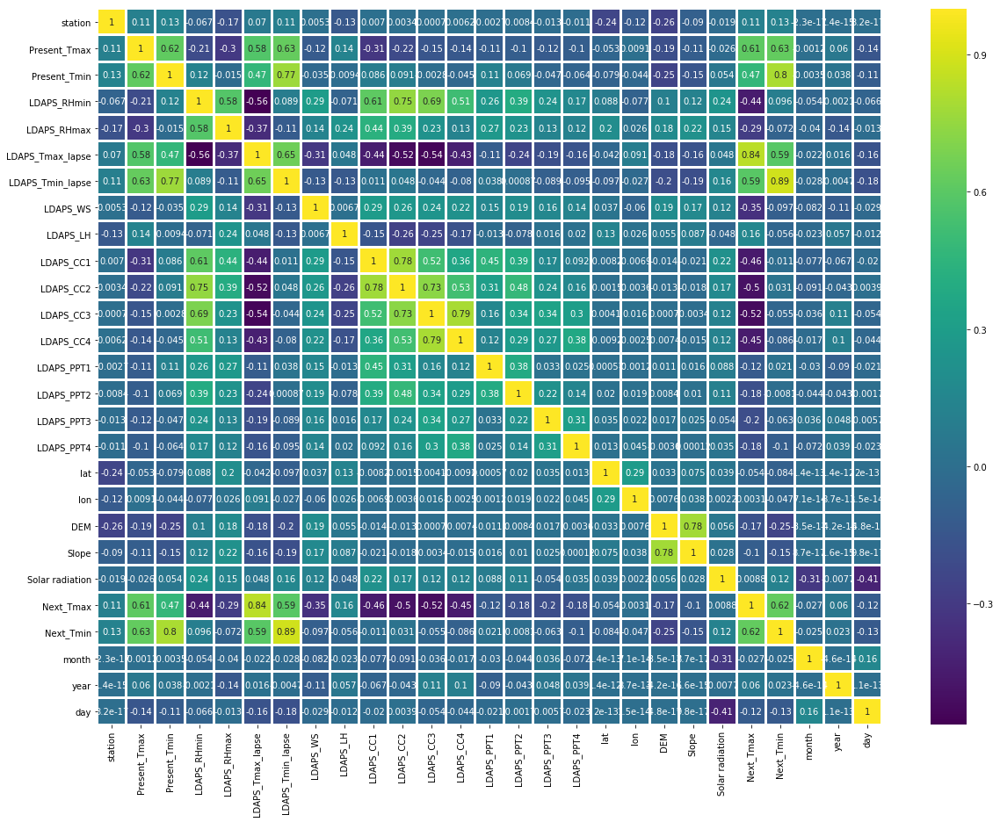

In [61]:
plt.figure(figsize = (20,15))
sns.heatmap(max_cor,annot = True, linewidths=2, cmap = 'viridis')

### Upon reviewing, I can see that the highest correlation of the features are between LDAPS_Tmin_lapse and Next_Tmin (target variable). Over all rest is fine. Lets proceed with model building

### Checking for outliers in the dataset and imputing them

In [62]:
dataset.isnull().sum()

station              2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
month                2
year                 2
day                  2
dtype: int64

### Dropping the nulls in Target columns which results in 0.4% data loss

In [63]:
dataset = dataset.dropna(subset = ['Next_Tmax', 'Next_Tmin']) 

In [64]:
dataset.shape

(7725, 27)

### Using iterative imputer to impute the missing values, I can see there are missing values in lot of columns

In [65]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imputer = IterativeImputer()

In [66]:
dataset[['Present_Tmin','LDAPS_RHmin','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_LH','Next_Tmin','LDAPS_CC1','LDAPS_CC2','LDAPS_CC3','LDAPS_CC4']] = imputer.fit_transform(dataset[['Present_Tmin','LDAPS_RHmin','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_LH','Next_Tmin','LDAPS_CC1','LDAPS_CC2','LDAPS_CC3','LDAPS_CC4']])

In [67]:
dataset.isnull().sum()

station              2
Present_Tmax        60
Present_Tmin         0
LDAPS_RHmin          0
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse     0
LDAPS_WS             0
LDAPS_LH             0
LDAPS_CC1            0
LDAPS_CC2            0
LDAPS_CC3            0
LDAPS_CC4            0
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax            0
Next_Tmin            0
month                2
year                 2
day                  2
dtype: int64

In [68]:
dataset[['Present_Tmax','LDAPS_Tmax_lapse','LDAPS_RHmax','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','Next_Tmax']] = imputer.fit_transform(dataset[['Present_Tmax','LDAPS_Tmax_lapse','LDAPS_RHmax','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','Next_Tmax']])

In [69]:
dataset.isnull().sum()

station             2
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
month               2
year                2
day                 2
dtype: int64

In [70]:
dataset = dataset.dropna(axis = 0)

In [71]:
dataset.shape

(7723, 27)

### We have handled the missing data very well, proceeding with the outlier detection

### Checking for outliers using boxplot

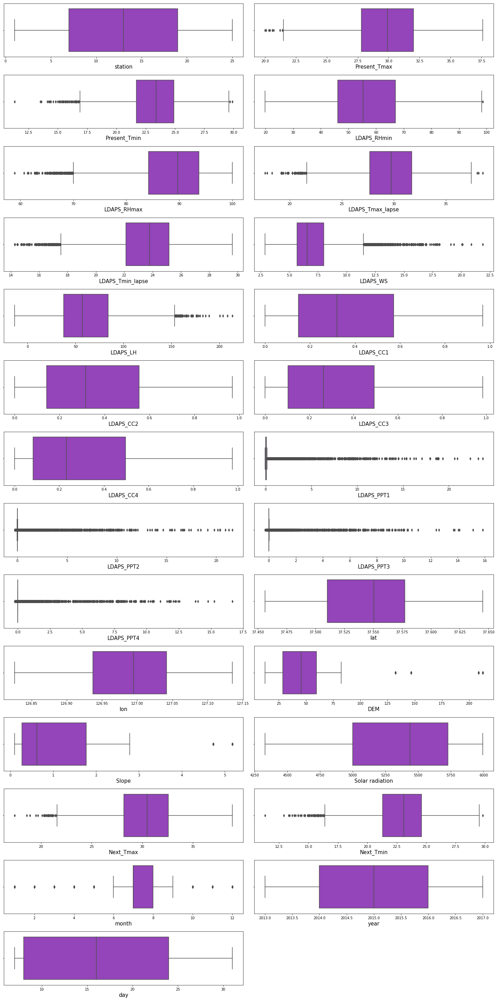

In [72]:
plt.figure(figsize = (20,40))
pltnum = 1

for i in dataset:
    if pltnum <=28:
        plt.subplot(14,2,pltnum)
        sns.boxplot(dataset[i],color = 'darkorchid')
        plt.xlabel(i, fontsize = 15)
    pltnum+=1
plt.tight_layout()

### We can see that there are lot of outliers with the continuous data columns. I'm removing the same using the zscore method

In [174]:
from scipy.stats import zscore
z = np.abs(zscore(dataset[['Present_Tmax','Present_Tmin','LDAPS_RHmax','LDAPS_Tmax_lapse','LDAPS_RHmin',
                          'LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_LH','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3']]))
z

,Present_Tmax,Present_Tmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_RHmin,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3
0,0.360529,0.758400,0.386732,0.533709,0.102547,0.224421,0.127403,0.208663,0.30541,0.275139,0.239116
1,0.720491,0.675292,0.315284,0.069431,0.308658,0.214290,0.647955,0.314094,0.30541,0.275139,0.239116
2,0.619146,0.031128,0.610722,0.151114,0.553840,0.440724,0.441797,1.250239,0.30541,0.275139,0.239116
3,0.754273,0.072682,1.136253,0.019845,0.101456,0.088191,0.667281,0.097492,0.30541,0.275139,0.239116
4,0.551582,0.550630,0.252500,0.180692,0.040297,0.019785,0.628041,1.358197,0.30541,0.275139,0.239116
...,...,...,...,...,...,...,...,...,...,...,...
7745,2.252314,2.254348,1.408404,0.622455,2.200880,2.231733,0.227003,1.577336,0.30541,0.275139,0.239116
7746,2.455005,2.420564,0.650321,0.998544,1.829917,2.440395,0.612762,0.587573,0.30541,0.275139,0.239116
7747,2.184750,2.545227,1.323434,1.118325,2.060045,2.030032,0.436857,0.286460,0.30541,0.275139,0.239116
7748,2.184750,2.295902,1.543358,0.894900,2.245372,2.048023,0.254917,0.454257,0.30541,0.275139,0.239116


In [228]:
dataset_new = dataset[(z<3).all(axis= 1)]
print(dataset_new.shape)
print(dataset.shape)

(6987, 27)
(7723, 27)


In [229]:
print('The data loss % after removing the outlier is', 100-((6987*100)/7750))

The data loss % after removing the outlier is 9.84516129032258


### There is a 7 -8 % data loss, hence proceeding with the data removal

### Checking for skewness in the data

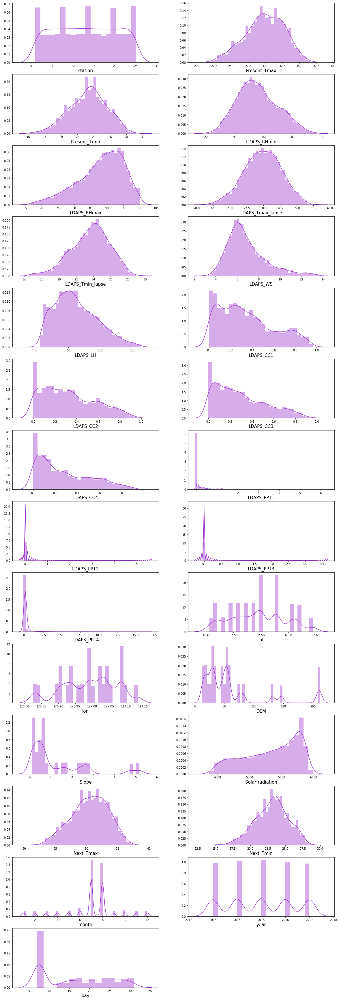

In [230]:
plt.figure(figsize = (20,90))
pltnum = 1

for i in dataset_new:
    if pltnum <=40:
        plt.subplot(20,2,pltnum)
        sns.distplot(dataset_new[i],color = 'darkorchid')
        plt.xlabel(i, fontsize = 15)
    pltnum+=1
plt.show()

#### Upon review, I can see that there are skewness in some of the features, checking for the skewness coefficient

In [231]:
dataset_new.skew()

station            -0.001105
Present_Tmax       -0.265562
Present_Tmin       -0.224394
LDAPS_RHmin         0.291297
LDAPS_RHmax        -0.682094
LDAPS_Tmax_lapse   -0.119196
LDAPS_Tmin_lapse   -0.384021
LDAPS_WS            1.083054
LDAPS_LH            0.568056
LDAPS_CC1           0.582485
LDAPS_CC2           0.504801
LDAPS_CC3           0.680441
LDAPS_CC4           0.721531
LDAPS_PPT1          3.758822
LDAPS_PPT2          4.879510
LDAPS_PPT3          5.490391
LDAPS_PPT4          7.890858
lat                 0.104183
lon                -0.282626
DEM                 1.763633
Slope               1.590495
Solar radiation    -0.499632
Next_Tmax          -0.267671
Next_Tmin          -0.283148
month              -0.684365
year                0.010467
day                 0.252321
dtype: float64

### Skewness is not under control for most of the features. there fore splitting the data and removing the skewness

In [232]:
x1 = dataset_new.drop(columns = 'Next_Tmax')
y1 = dataset_new['Next_Tmax']
x2  = dataset_new.drop(columns = 'Next_Tmin')
y2 = dataset_new['Next_Tmin']

### Applying scaling on all the independent variables

In [233]:
from sklearn.preprocessing import MinMaxScaler
scal = MinMaxScaler()
sc =  scal.fit_transform(x1)
x1 = pd.DataFrame(sc, columns = x1.columns)

In [234]:
sc1 =  scal.fit_transform(x2)
x2 = pd.DataFrame(sc1, columns = x2.columns)

### I have splitted x1,x2 and y1,y2 because there are two predictions to make hence applying transformation on both x datas (x1 and x2)

In [235]:
tr = power_transform(x1, method = 'yeo-johnson')
x1 = pd.DataFrame(tr, columns = x1.columns)

In [236]:
x1.skew()

station            -0.061975
Present_Tmax       -0.037770
Present_Tmin       -0.024299
LDAPS_RHmin         0.000663
LDAPS_RHmax        -0.117357
LDAPS_Tmax_lapse   -0.016563
LDAPS_Tmin_lapse   -0.031010
LDAPS_WS            0.022678
LDAPS_LH            0.034369
LDAPS_CC1           0.059712
LDAPS_CC2           0.047043
LDAPS_CC3           0.088288
LDAPS_CC4           0.135516
LDAPS_PPT1          1.716040
LDAPS_PPT2          1.666113
LDAPS_PPT3          0.117615
LDAPS_PPT4          2.218166
lat                -0.030439
lon                -0.077089
DEM                 0.272826
Slope               0.384159
Solar radiation    -0.198706
Next_Tmin          -0.018268
month               0.080074
year               -0.071221
day                 0.034137
dtype: float64

### skewness is not under control for the columns LDAPS_PPTs, Proceeding with model building and removing them if the model isn't good

In [237]:
tr1 = power_transform(x2, method = 'yeo-johnson')
x2 = pd.DataFrame(tr1, columns = x2.columns)

In [238]:
x2.skew()

station            -0.061975
Present_Tmax       -0.037770
Present_Tmin       -0.024299
LDAPS_RHmin         0.000663
LDAPS_RHmax        -0.117357
LDAPS_Tmax_lapse   -0.016563
LDAPS_Tmin_lapse   -0.031010
LDAPS_WS            0.022678
LDAPS_LH            0.034369
LDAPS_CC1           0.059712
LDAPS_CC2           0.047043
LDAPS_CC3           0.088288
LDAPS_CC4           0.135516
LDAPS_PPT1          1.716040
LDAPS_PPT2          1.666113
LDAPS_PPT3          0.117615
LDAPS_PPT4          2.218166
lat                -0.030439
lon                -0.077089
DEM                 0.272826
Slope               0.384159
Solar radiation    -0.198706
Next_Tmax          -0.039202
month               0.080074
year               -0.071221
day                 0.034137
dtype: float64

### Skewness for LDAPS_PPT1 is still not under control, proceeding with the model building for this too. Removing it if the model isn't good. Presence of outliers/skewness isn't good for the model

### Checking for outliers again for x1 and x2

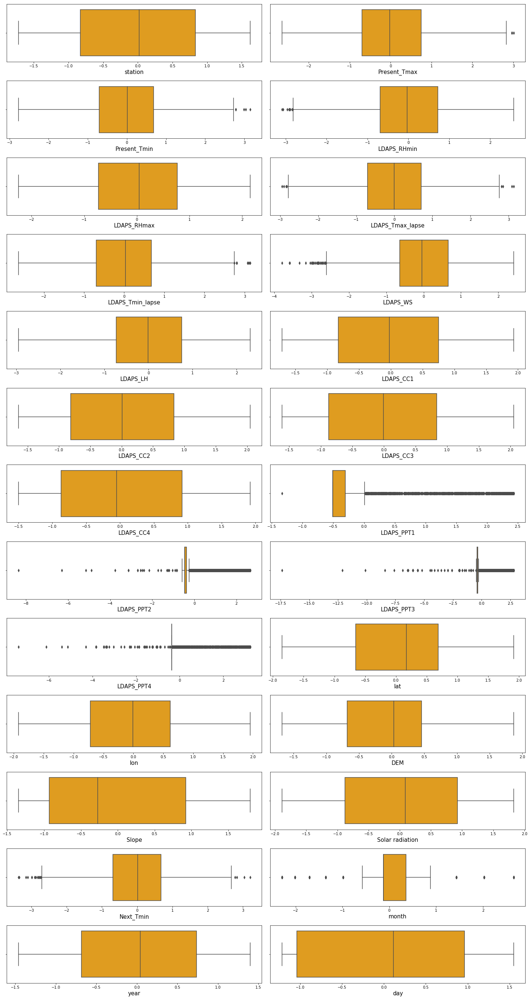

In [239]:
plt.figure(figsize = (20,40))
pltnum = 1

for i in x1:
    if pltnum <=28:
        plt.subplot(14,2,pltnum)
        sns.boxplot(x1[i],color = 'orange')
        plt.xlabel(i, fontsize = 15)
    pltnum+=1
plt.tight_layout()

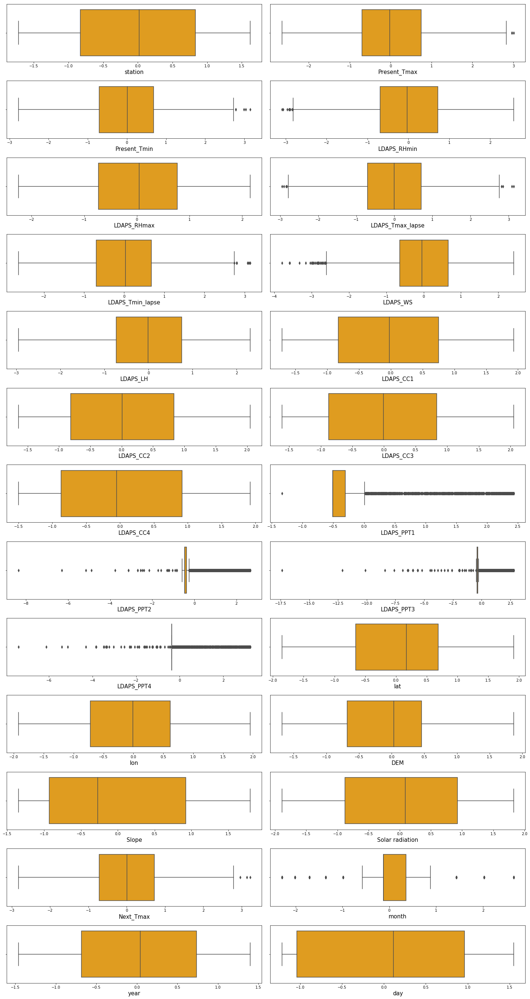

In [240]:
plt.figure(figsize = (20,40))
pltnum = 1

for i in x2:
    if pltnum <=28:
        plt.subplot(14,2,pltnum)
        sns.boxplot(x2[i],color = 'orange' )
        plt.xlabel(i, fontsize = 15)
    pltnum+=1
plt.tight_layout()

### I can still see the presence of outliers in some of the colmumns in both x1 and x2

### Checking for distribution again

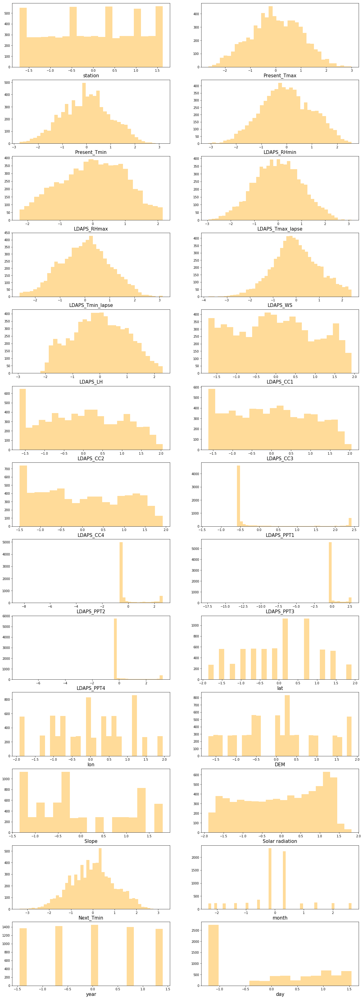

In [241]:
plt.figure(figsize = (20,90))
pltnum = 1

for i in x1:
    if pltnum <=40:
        plt.subplot(20,2,pltnum)
        sns.distplot(x1[i],color = 'orange', kde=False)
        plt.xlabel(i, fontsize = 15)
    pltnum+=1
plt.show()

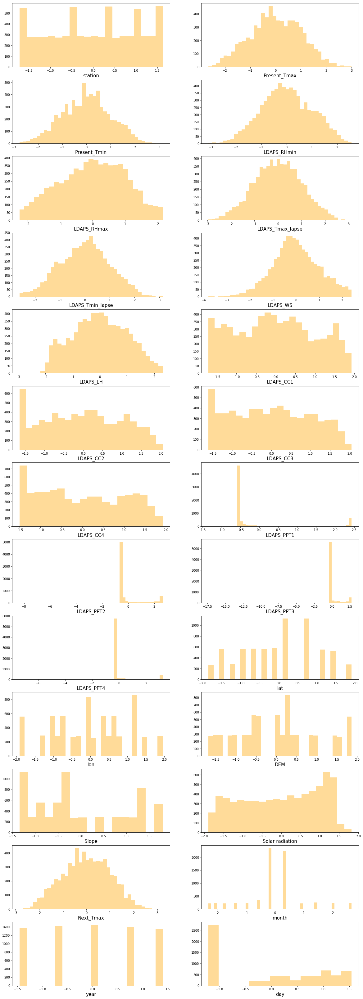

In [242]:
plt.figure(figsize = (20,90))
pltnum = 1

for i in x2:
    if pltnum <=40:
        plt.subplot(20,2,pltnum)
        sns.distplot(x2[i],color = 'orange', kde=False)
        plt.xlabel(i, fontsize = 15)
    pltnum+=1
plt.show()

### I can still see the presence of skewness in the distribution, let's proceed with model building and take a call

In [243]:
x1 = x1.drop(columns=['LDAPS_PPT4'])

In [268]:
x1 =x1.drop(columns = ['Solar radiation', 'lon' ,'month'])            

# Prediction of Next_Tmax

### Finding the best Random State

In [269]:
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, LassoCV
rs = 0
for i in range(0,2000):
    x_train,x_test,y_train,y_test = train_test_split(x1,y1,random_state = i, test_size = 0.3)
    lr = LinearRegression()
    lr.fit(x_train,y_train)
    tr_score = lr.score(x_train,y_train)
    ts_score = lr.score(x_test,y_test)
    if round(tr_score*100,1) == round(ts_score*100,1):
        if i> rs:
            rs = i
print('the best random state is', rs)

the best random state is 1932


In [270]:
x_train,x_test,y_train,y_test = train_test_split(x1,y1,test_size = 0.3,random_state =rs)

## Model 1: linear Regression

In [271]:
lin = LinearRegression()
lin.fit(x_train,y_train)
lin_pred = lin.predict(x_test)
lin_score = lin.score(x_test,y_test)
lin_score

0.7866868364305853

In [272]:
lin_rmse = np.sqrt(mean_squared_error(y_test,lin_pred))
print('RMSE for Linear Regression: ', lin_rmse)

RMSE for Linear Regression:  1.3518580335879224


## Model 2: Random Forest Regressor

In [273]:
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor()
rfr.fit(x_train,y_train)
rfr_pred = rfr.predict(x_test)
rfr_score = rfr.score(x_test,y_test)
rfr_score

0.8923522513712283

In [274]:
rfr_rmse = np.sqrt(mean_squared_error(y_test,rfr_pred))
print('RMSE for Random Forest Regression: ', rfr_rmse)

RMSE for Random Forest Regression:  0.9603393701031673


## Model 3: Extra Trees Regressor

In [275]:
from sklearn.ensemble import ExtraTreesRegressor
et = ExtraTreesRegressor()
et.fit(x_train,y_train)
et_pred = et.predict(x_test)
et_score = et.score(x_test,y_test)
et_score

0.9234218061624909

In [276]:
et_rmse = np.sqrt(mean_squared_error(y_test,et_pred))
print('RMSE for Extra Trees Regression: ', et_rmse)

RMSE for Extra Trees Regression:  0.8099809734779455


## Model 4: Support Vector Regressor

In [277]:
from sklearn.svm import SVR
svr = SVR()
svr.fit(x_train,y_train)
svr_pred = svr.predict(x_test)
svr_score = svr.score(x_test,y_test)
svr_score

0.8790841467878772

In [278]:
sv_rmse = np.sqrt(mean_squared_error(y_test,svr_pred))
print('RMSE for Support Vector Regression: ', sv_rmse)

RMSE for Support Vector Regression:  1.0178033600749448


## Model 5: XGB Regressor

In [279]:
from xgboost import XGBRegressor
xgb = XGBRegressor()
xgb.fit(x_train,y_train)
xgb_pred = xgb.predict(x_test)
xgb_score = xgb.score(x_test,y_test)
xgb_score

0.9167816942047993

In [280]:
xg_rmse = np.sqrt(mean_squared_error(y_test,xgb_pred))
print('RMSE for XGB Regression: ', xg_rmse)

RMSE for XGB Regression:  0.8443678578927938


## Checking for model over fitting using cross val score

In [281]:
cv = cross_val_score(lin,x1,y1,scoring = 'r2', cv =3)
cv = cv.mean()
cv

0.6836397102460855

In [282]:
cv1 = cross_val_score(rfr,x1,y1,scoring = 'r2', cv =3)
cv1 = cv1.mean()
cv1

0.7059225956855766

In [283]:
cv2 = cross_val_score(et,x1,y1,scoring = 'r2', cv =3)
cv2 = cv2.mean()
cv2

0.714500755585259

In [284]:
cv4 = cross_val_score(svr,x1,y1,scoring = 'r2', cv =3)
cv4 = cv4.mean()
cv4

0.7080479650654244

In [285]:
cv5 = cross_val_score(xgb,x1,y1,scoring = 'r2', cv =3)
cv5 = cv5.mean()
cv5

0.7122847182272514

### Identifying the best model

In [286]:
mod = [lin_score, rfr_score, et_score,svr_score,xgb_score]
cv = [cv,cv1,cv2,cv4,cv5]
rmse = [lin_rmse,rfr_rmse,et_rmse,sv_rmse,xg_rmse]
model = pd.DataFrame({})
model['mod'] = mod
model['cv'] = cv
model['rmse'] = rmse
model['difference'] = model['mod']-model['cv']
model

,mod,cv,rmse,difference
0,0.786687,0.683640,1.351858,0.103047
1,0.892352,0.705923,0.960339,0.186430
2,0.923422,0.714501,0.809981,0.208921
3,0.879084,0.708048,1.017803,0.171036
4,0.916782,0.712285,0.844368,0.204497


## Random Forest Regressor is the best model considering the RMSE and the level of fit.

### Hyper Parameter Tuning

In [287]:
params = {'n_estimators':[100,150,200,250,300],
         'max_depth':[9,11,13,15],
         'min_samples_split':[3,4,5,6],
         'min_samples_leaf':[2,3,4,5],
         }

In [288]:
gcv = GridSearchCV(RandomForestRegressor(),params, cv = 3, n_jobs = -1)
gcv.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [9, 11, 13, 15],
                         'min_samples_leaf': [2, 3, 4, 5],
                         'min_samples_split': [3, 4, 5, 6],
                         'n_estimators': [100, 150, 200, 250, 300]})

In [289]:
gcv.best_params_

{'max_depth': 15,
 'min_samples_leaf': 2,
 'min_samples_split': 3,
 'n_estimators': 250}

### Fitting the final model

In [290]:
fnl_mod1 = RandomForestRegressor(max_depth = 15,min_samples_leaf = 2,min_samples_split =3,n_estimators =250, n_jobs =-1)

fnl_mod1.fit(x_train,y_train)
fnl1_pred = fnl_mod1.predict(x_test)
fnl1_score = fnl_mod1.score(x_test,y_test)
fnl1_score

0.8917784533386361

In [292]:
fnl1_rmse = np.sqrt(mean_squared_error(y_test,fnl1_pred))
print('RMSE for Final Random Forest Regression: ', fnl1_rmse)

RMSE for Final Random Forest Regression:  0.9628954313833982


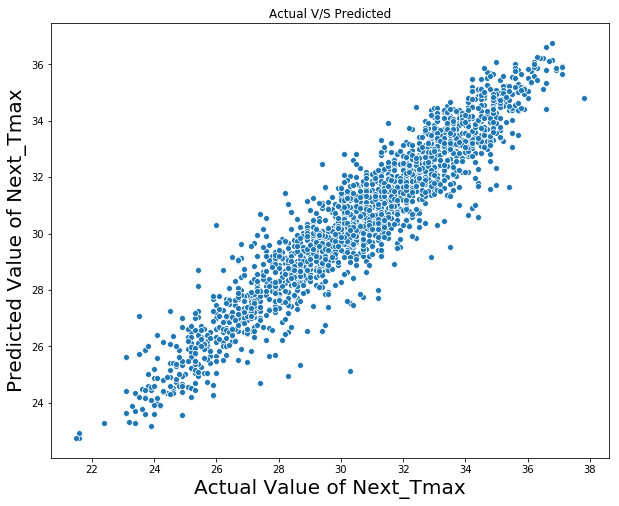

In [293]:
plt.figure(figsize = (10,8))
sns.scatterplot(x = y_test, y = fnl1_pred)
plt.xlabel('Actual Value of Next_Tmax', fontsize = 20)
plt.ylabel('Predicted Value of Next_Tmax', fontsize = 20)
plt.title('Actual V/S Predicted')
plt.show()

In [294]:
import joblib
joblib.dump(fnl_mod1,'temperature_Next_Tmax.pkl')

['temperature_Next_Tmax.pkl']

# Prediction of Next_Tmin

### Finding the best random state

In [295]:
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, LassoCV
rs = 0
for i in range(0,2000):
    x_train,x_test,y_train,y_test = train_test_split(x2,y2,random_state = i, test_size = 0.3)
    lr = LinearRegression()
    lr.fit(x_train,y_train)
    tr_score = lr.score(x_train,y_train)
    ts_score = lr.score(x_test,y_test)
    if round(tr_score*100,1) == round(ts_score*100,1):
        if i> rs:
            rs = i
print('the best random state is', rs)

the best random state is 1973


In [296]:
x_train,x_test,y_train,y_test = train_test_split(x2,y2,test_size = 0.3,random_state =rs)

## Model 1: Linear Regression

In [297]:
lr = LinearRegression()
lr.fit(x_train,y_train)
lr_pred = lr.predict(x_test)
lr_score = lr.score(x_test,y_test)
lr_score

0.8412169134582425

In [298]:
lr_rmse = np.sqrt(mean_squared_error(y_test,lr_pred))
print('RMSE for Linear Regression: ', lr_rmse)

RMSE for Linear Regression:  0.9601820443413238


## Model 2: Random Forest Regressor

In [299]:
rf = RandomForestRegressor()
rf.fit(x_train,y_train)
rf_pred = rf.predict(x_test)
rf_score = rf.score(x_test,y_test)
rf_score

0.8998506902390921

In [300]:
rf_rmse = np.sqrt(mean_squared_error(y_test,rf_pred))
print('RMSE for Random Forest Regression: ', rf_rmse)

RMSE for Random Forest Regression:  0.7625624931980509


## Model 3: Extra Trees Regressor

In [301]:
et = ExtraTreesRegressor()
et.fit(x_train,y_train)
et_pred = et.predict(x_test)
et_score = et.score(x_test,y_test)
et_score

0.9152572730507721

In [302]:
et_rmse = np.sqrt(mean_squared_error(y_test,et_pred))
print('RMSE for Extra Trees Regression: ', et_rmse)

RMSE for Extra Trees Regression:  0.7014596237272676


## Model 4: XGB Regressor

In [303]:
xgb = XGBRegressor()
xgb.fit(x_train,y_train)
xgb_pred = xgb.predict(x_test)
xgb_score = xgb.score(x_test,y_test)
xgb_score

0.931360124189919

In [304]:
xgb_rmse = np.sqrt(mean_squared_error(y_test,xgb_pred))
print('RMSE for XGB Regression: ', xgb_rmse)

RMSE for XGB Regression:  0.6313056918054277


## Model 5: Support Vector Regressor

In [305]:
svr = SVR()
svr.fit(x_train,y_train)
svr_pred = svr.predict(x_test)
svr_score = svr.score(x_test,y_test)
svr_score

0.9202714270251058

In [306]:
sv_rmse = np.sqrt(mean_squared_error(y_test,svr_pred))
print('RMSE for Support Vector Regression: ', sv_rmse)

RMSE for Support Vector Regression:  0.6803908363959483


## Cross Validation Score to determine over fitting

In [308]:
cv = cross_val_score(lr,x2,y2,scoring ='r2', cv = 5)
cv = cv.mean()
cv

0.7895916906563964

In [309]:
cv1 = cross_val_score(rf,x2,y2,scoring ='r2', cv = 5)
cv1 = cv1.mean()
cv1

0.7945859718429183

In [310]:
cv2 = cross_val_score(et,x2,y2,scoring ='r2', cv = 5)
cv2 = cv2.mean()
cv2

0.7986298832351512

In [311]:
cv3 = cross_val_score(xgb,x2,y2,scoring ='r2', cv = 5)
cv3 = cv3.mean()
cv3

0.7785721111947949

In [312]:
cv4 = cross_val_score(svr,x2,y2,scoring ='r2', cv = 5)
cv4 = cv4.mean()
cv4

0.7418531860028093

## Final model Selection

In [313]:
mod1 = [lr_score,rf_score,et_score,xgb_score,svr_score]
cv = [cv,cv1,cv2,cv3,cv4]
rmse = [lr_rmse,rf_rmse,et_rmse,xgb_rmse,sv_rmse]
model2 = pd.DataFrame({})
model2['mod1'] = mod1
model2['cv'] = cv
model2['rmse'] = rmse
model2['diff'] = model2['mod1'] - model2['cv']
model2

,mod1,cv,rmse,diff
0,0.841217,0.789592,0.960182,0.051625
1,0.899851,0.794586,0.762562,0.105265
2,0.915257,0.798630,0.701460,0.116627
3,0.931360,0.778572,0.631306,0.152788
4,0.920271,0.741853,0.680391,0.178418


## The best model here is Random Forest Regressor based on the fit and the RMSE

## Hyper Parameter Tuning for the Random Forest Regressor

In [314]:
params = {'n_estimators':[100,150,200,250,300],
         'max_depth':[9,11,13,15],
         'min_samples_split':[3,4,5,6],
         'min_samples_leaf':[2,3,4,5],
         }

In [315]:
gcv = GridSearchCV(RandomForestRegressor(),params, cv = 3, n_jobs = -1)
gcv.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [9, 11, 13, 15],
                         'min_samples_leaf': [2, 3, 4, 5],
                         'min_samples_split': [3, 4, 5, 6],
                         'n_estimators': [100, 150, 200, 250, 300]})

In [316]:
gcv.best_params_

{'max_depth': 15,
 'min_samples_leaf': 2,
 'min_samples_split': 4,
 'n_estimators': 250}

### Fitting the final model

In [317]:
fnl_mod2 = RandomForestRegressor(max_depth = 15, min_samples_leaf =2, min_samples_split= 4, n_estimators = 250, n_jobs =-1)
fnl_mod2.fit(x_train,y_train)
fnl2_pred = fnl_mod2.predict(x_test)
fnl2_score = fnl_mod2.score(x_test,y_test)
fnl2_score

0.8988975302003901

In [318]:
fnl2_rmse = np.sqrt(mean_squared_error(y_test,fnl2_pred))
print('RMSE for Final Random Forest Regression: ', fnl2_rmse)

RMSE for Final Random Forest Regression:  0.7661827021825515


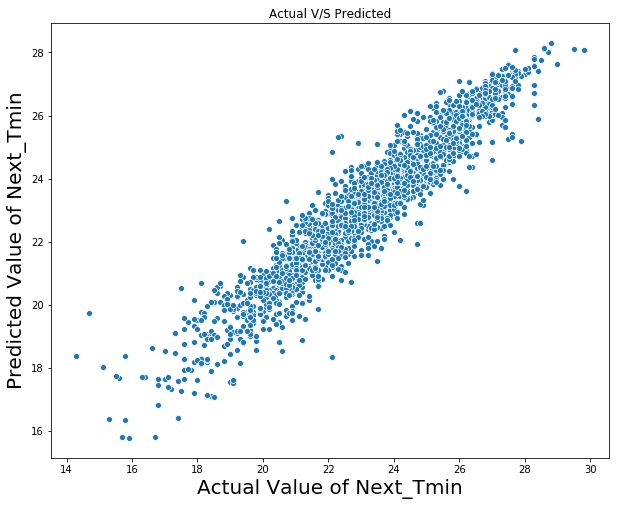

In [319]:
plt.figure(figsize = (10,8))
sns.scatterplot(x = y_test, y = fnl2_pred)
plt.xlabel('Actual Value of Next_Tmin', fontsize = 20)
plt.ylabel('Predicted Value of Next_Tmin', fontsize = 20)
plt.title('Actual V/S Predicted')
plt.show()

## Saving model2

In [320]:
joblib.dump(fnl_mod2,'temperature_Next_Tmin.pkl')

['temperature_Next_Tmin.pkl']